# Capstone proposal by Jordi Figueras i Ventura

# Hail detection from satellite data

In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import datetime
import PIL.Image as Image

## 1) The problem

Hail is one of the most damaging natural hazards. The exact location of hail and the hail size is very difficult to predict. Typically the detection of hail over large areas is perfomed from weather radar data. Hail pads or more sophisticated hail sensors on the ground are also very useful to precisely quantify parameters such as the hail size, the kinetic energy, etc. but, because hail is a rare and localized phenomenon, ground station networks cannot provide sufficient areal coverage and, therefore, primarily serve as benchmark for remote sensing methods.

Weather radar networks cover relatively well densely inhabited areas of developed countries but there are wide areas of the Earth with poor coverage. In particular in developing countries, which are also the most vunerable to natural hazards. Moreover, weather radar networks tend to have a national scope and, if continental scale studies of hail are desired, the data may not be readily available and it will definitely not be homogeneous since each country operates different networks with different specifications.

Satellite data, on the other hand, covers the entire globe and can be accessed with relative easiness. Therefore, it would be convenient to identify structures in satellite images that are strong indicators of the presence of hail. Cloud top structures observable from satellites indicating severe weather include overshooting tops (OT), cold rings, U- and V-shapes, and above anvil plumes. 

According to [Wikipedia](https://en.wikipedia.org/wiki/Overshooting_top) an OT is a dome-like protrusion out of the top of the anvil of a thunderstorm and into the lower stratosphere (See picture below). It is formed in areas of strong updraft. OTs are strong indicators of severe weather (lightning, wind gusts, heavy rain, hail and even tornadoes), particularly if they last for more than 10 min.

<img src="Cumulonimbus13_-_NOAA.jpg" align="center"/>
<center><i>Picture of a cumulonimbus with a cloud overshooting top. Source: <a href="https://www.noaa.gov/">National Oceanic and Atmospheric Administration NOAA]</a><\i><\center>

Traditionally, OTs have been identified by humans in satellite images. They can be seen as "cauliflower-like" structures when the sun is close to the zenith. At lower elevation angles, the shadow of the OT is easily observable in the visibile channel satellite image. This is a cumbersome process and prone to error because a forecaster needs to constantly monitor new satellite imaginery. It is also a time-consuming process, specially if the forecaster is responsible to issue warnings for a large area. Furthermore, manually identifying and delimiting OTs does not integrate well with the automatized processess used in modern severe weather warning systems. For this reasons, an automatic identification of OTs is highly desirable. 

## 2) The data

### (a) Clear overview of your data

Mainly, data from two different systems will be used in this project: Satellite and weather radar network.

#### Satellite data

First and foremost, data from the [Meteosat 2nd generation (MSG)](https://www.eumetsat.int/website/home/Satellites/CurrentSatellites/Meteosat/index.html) satellites will be used. MSG is a network of 4 satellites placed at geostationary orbit (36000 km above Earth). Two of them are operational and the other two are used as a backup. They are owned and operated by the EUMETSAT consortium.

On board of each satellite there is the Spinning Enhanced Visible and Infrared Imager (SEVIRI). This instrument is a radiometer sensing 12 different spectral channels, 8 thermal infrared (at wavelengths centered at 3.9, 6.2 (for water vapor), 7.3 (for water vapor), 8.7, 9.7, 10.8, 12.0 and 13.4 $\mu m$) and 4 visible and near-infrared (at wavelengths centered at 0.6, 0.8 and 1.6 (ner-infrared) $\mu m$, the high resolution visible is wide bandwidth). The visible and near-infrared channels are sensitive to the solar radiation (hence only available during daylight) and the observations are usually provided as reflectance in percentage. The infrared channels are sensitive to the thermal emission of the Earth, usually expressed as brightness temperature in K, except for the 3.9 channel that is sensitive to both. Each channel is more sensitive to a particular characteristic of the atmosphere.

11 of those channels have a sub-satellite resolution of 3 km while one of the visible ones has a 1 km resolution. Due to the viewing angle, in Europe, the resolution in North-South direction is 1.5 times larger than the sub-satellite resolution. The latest MSG satellite provides an image of the full disk every 15 min (full disk service). Another MSG satellite provides the Rapid Scan Service (RSS), images of the upper disk (i.e. roughly centered over Europe) every 5 min.

Since 2018 MeteoSwiss has pre-processed and archived this satellite data. SEVIRI is available over 99.7% of the time. The pre-processing consist on a parallax correction, the transformation of the data into Swiss coordinates and a cropping of the images to a smaller area centered on Switzerland that corresponds to the weather radar network domain explained below. Due to the satellite viewing geometry, high clouds appear to be further north on the Northern hemisphere. When performing the parallax correction, pixels of elevated clouds are shifted to the south, leaving missing values. In our files, those are interpolated with nearest neighbour.

Data from 2.5 convective seasons (roughly from April to September) are readily available. That means that there are images covering 16 months with a 5 min resolution, that is 288 images per day. Therefore, roughly speaking there are 155520 images with information. Obviously not all these images are of interest. Furthermore, the visible and near-infrared channels only provides information during day time, hence roughly half of the images will be available for the daylight detection. The plan is to keep all the images that have a cloud top structure indicating severe weather (in particular overshooting tops) according to the specifications below and, if necessary, add a similar number of images where overshooting tops are not likely.

<img src="Satellite.png" align="center"/>
<center><i>Satellite image with two overshooting tops marked with arrows. Left: High resolution visible. Right: infrared 10.8</i><\center>

#### Weather radar data

The other dataset is provided by the MeteoSwiss owned and operated [Weather Radar Network](https://www.meteoswiss.admin.ch/home/measurement-and-forecasting-systems/atmosphere/weather-radar-network.html). This network consists of 5 Doppler polarimetric weather radars (Albis, La Dole, Lema, Plaine Morte and Weissflug) distributed within Switzerland so that they cover Switzerland and the surrounding area (see map below).

<img src="MeteoSwiss_radar_network.jpg" align="center"/>
<center><i>MeteoSwiss Weather Radar Network</i><\center>
    

Each weather radar provides, among other data, polarimetric and Doppler moments (horizontal reflectivity, differential reflectivity, differential phase, copolar correlation coefficient Doppler velocity and Doppler spectral width) over an area up to a distance of 246 km with an initial resolution of 83.3 m in range and 1° beam width. The radars scan a complete volume space every 5 min. The scanning strategy consists in turning horizontally the radar antenna at a fixed elevation angle until the antenna has performed a complete revolution. It is then steered to another elevation angle and the process is repeated. A total of 20 different elevations ranging from -0.2° to 40° form a volume scan.

Out of the data from the 5 individual radars, a composite covering a 3D volume over Switzerland and the surrounding area is created. This composite has 1 km horizontal resolution and has 93 vertical levels separated by 200 m and ranging from 1.5 to 20 km MSL. A value for each grid point (i.e. a 1 km x 1 km x 200 m cube) is assigned using all radar measurements within the cube. The assigment can be performed using any statistic such as the maximum, the median, the mean, etc. The radar composite covers an area of 710 km from West to East and 640 km from South to North centered in Switzerland. Pixels beyond the radar range are simply filled with NaNs. From this composite, secondary products such as rainfall rate on the ground are generated.

The radar-derived dataset that will be used in this project is the Probability of Hail (POH) on the ground. This product is generated out of the 3D composite of radar reflectivity and an estimation of the altitude of the 0°C isotherm above mean sea level provided by the numerical weather prediction (NWP) model COSMO-1. The 0°C isotherm is defined as the first altitude where the air temperature is equal to 0°C when moving from the top to the bottom of the atmosphere. Based on the 3D composite of radar reflectivity, the echo-top 45 dBZ is estimated. The echo-top 45 dBZ is defined as the highest altitude where a reflectivity level of 45 dBZ or more is reached. The basic parameter that is computed to get POH is the height difference between the 0°-isotherm and the echo-top 45 dBZ altitude. An empirical relationship is used to estimate the probability of hail on the ground from this height difference. The POH is proportional to the height difference, i.e. the higher the difference the higher the probability of hail. POH is computed in real-time and archived since its operational implementation in 2004.

The figure below shows an example of of daily accumulated POH for the 21st of July 2020. When the POH is very high (i.e. on the order of 90%) there is also a very high probability that an OT can be observed in the satellite images. Areas with POH above 90% will be marked in the satellite data. Those will constitute the validation and testing datasets.

<img src="POH20203.gif" align="center"/>
<img src="TRT_color_poh.gif" align="center"/>
<center><i>Daily maximum POH for day 21 July 2020<\i><\center>

#### Other relevant data

The objective of the project is to be able to detect cloud top structures indicating severe weather with reasonable scores using exclusively satellite data. If the retrieval performance is too poor for final applications, we will explore  the possibility of adding extra datasets for the detection. These datasets carry information on conditions that can result on the formation of overshooting tops. A simple parameter may be the sun position since, depending on it, the satellite image looks slightly different. One dataset that may be used is a digital elevation model (DEM). This will account for the orographic effects that are known to favour the formation of severe thunderstorms. Another dataset could be motion vectors derived from radar images. Again this information may be useful because wind shear favours the formation of mesoscale convective systems, and the orientation of U- and V-shapes as well as the plume transport are determined by the wind.. Finally, data from the NWP COSMO-1 model (atmospheric instability indices like CAPE and CIN, temperature, humidity, 3D wind vectors, etc.) can also be added if the time frame of the project allows for it. 

## Summary of the data availability

As it will be shown in the sections below, from the archive of POH data we obtained a total of 5060 images containing pixels with POH above 90%. Those images were taken over 185 days in the 3-year period examined. However, due to gaps in the satellite data archive only 4357 images are available for the exercise. We will reserve 357 images for test (roughly 8%) and the other 4000 for training and validation. Due to the somehow limited amount of data, the training-validation split of the remaining data will be 90-10%. That is, 3600 images for training and 400 for validation.

### (b) Plan to manage and process the data

All data from the convective seasons (April to September) of 2018, 2019 and 2020 will be stored in a server. There will be a main folder for each dataset (satellite, POH, etc.). The subfolder structure for the satellite data is [yyyy]/[mm]/[dd] while the subfolder structure for the POH data is [yyyy]/[JJJ], where [JJJ] is the Julian day. Hence in each subfolder there will be 288 files. this number and all estimations below assume full data availability.

Satellite data is stored in [NETCDF (network Common Data Form)](https://www.unidata.ucar.edu/software/netcdf/) format and compliant with the [Climate and Forecast (CF)](http://cfconventions.org/) Conventions and metadata. 

POH information is stored in a proprietary format called METRANET. The files have a text header with metadata and a binary part with compressed data. The data is coded in 1 byte, therefore it has 256 values ranging from 0 to 100%.

We examine data from 2018, 2019 and 2020. The data analyzed goes from 1st April to 30 September (i.e. 183 days) for years 2018 and 2019 and from 1st April to 31 July (i.e. 122 days) for 2020. We have therefore a total of 488 days. Data is collected every 5 minutes, so there are 288 images per day. Hence the total number of images usable is 140544.

All original satellite images and POH data are mapped in Swiss coordinates and cover an area of 710 x 640 km with a resolution of 1 $km^2$. We have delimited an area covering Switzerland that goes roughly from 45.7° to 48° latitude and 5.5° to 11° longitude. This allows to tackle the problem of not having radar data in all the original area. Furthermore, in this reduced area, POH is more precise since data from many radars overlap. The resultant images have 448x256 pixels.

The first task of the project will be to determine which time steps contain hail events. This will be performed by analyzing the POH data and detecting images where a significant portion of pixels have a POH of 90% or above (hereby called POH90 pixels). In a second step, the time steps will be divided in day-time, night-time and transition between night/day images. This information will be stored in a database or a csv file and used to select the images for the experiment. A similar number of time steps with no POH90 pixels will be selected from the rest of the images, particularly those containing clouds and/or rain (low mean IR108), to complete the data in the project.

On all the selected datasets a mask will be created with "True" values assigned to POH90 pixels and "False" values to the rest. We expand the "True" values so that the POH90 area cover at least an area equal to the lower resolution of the satellite imaginery (i.e 3x4.5) to make sure that satellite structures are captured by the mask. Satellite images and POH images are not measured at the exact same time and there may be small drifts in the images. Furthermore there may be small errors in the positioning of both data (in particular the parallax correction uses the retrieval of the cloud top height, which might include errors by itself). Considering all that, the final POH90 area may be even extended further.

The primary goal of this project is the development of a retrieval during day time, when the high resolution visible and the near-infrared channels are available. OTs are observable by naked eye in the HRV channel. Another important channel is the infrared 10.8 $\mu m$ because it gives a good estimate of cloud top temperature (and therefore cloud top height). From the case studies in section 3 we have observed that the difference between the infrared channels Water vapour 6.2 and 10.8 $\mu m$ is also a good indicator of the presence of OTs. These 3 features have been used in the pass for the detection of OTs. If the models used prove not to be sufficiently successful and the project time allow for it, we may expand it by using other SEVIRI channels or differences between channels. Nightime detection of overshooting tops is known to be much more difficult and therefore we do not plan to tackle the problem at this point.

## 3) Exploratory data analysis (EDA)

### (a) Preliminary EDA

We have looked for data with a Probability of Hail at least above 90%, which is a very good indicator for hail on the ground. We found that there are 3820 images in 2018, 3063 images in 2019 and 1554 images in 2020 that have at least one POH90 pixel in the area of interest (total 8437).

We are primarily interested in images taken during daylight because it is when the high resolution visible channel provides information. We have defined a daylight image as an image taken when the sun elevation over the horizon is at least 10° over the entire region delimited by the coordinates above. Night time images are defined as when the sun elevation over the horizon is below 0° in all the region and the rest are considered images taken during the transition between day and night.

There are a total of 5060 satellite images taken during day light. The distribution of the number of POH90 pixels within the delimited region is skewed towards 1. There are 430 images with just 1 POH90 pixel, 329 with 2, 238 with 3, 215 with 4 and 157 with 5. Hence, 27% of the images have 5 or less POH90 pixels. The maximum number of POH90 pixels in an image is 705.

In [2]:
# read the 3 CSV files containing POH statistics
df_2018 = pd.read_csv('2018_POH_above_90_percent.csv', usecols=['nominal time', 'day/night', 'npixels with POH > 90%'])
df_2018['nominal time'] = pd.to_datetime(df_2018['nominal time'])
print('Number of time steps with POH > 90% in 2018:', df_2018.shape[0])

df_2019 = pd.read_csv('2019_POH_above_90_percent.csv', usecols=['nominal time', 'day/night', 'npixels with POH > 90%'])
df_2019['nominal time'] = pd.to_datetime(df_2019['nominal time'])
print('Number of time steps with POH > 90% in 2019:', df_2019.shape[0])

df_2020 = pd.read_csv('2020_POH_above_90_percent.csv', usecols=['nominal time', 'day/night', 'npixels with POH > 90%'])
df_2020['nominal time'] = pd.to_datetime(df_2020['nominal time'])
print('Number of time steps with POH > 90% in 2020:', df_2020.shape[0])

df = pd.concat([df_2018, df_2019, df_2020])
print('Total number of time steps with POH > 90%:', df.shape[0])
df.head()

Number of time steps with POH > 90% in 2018: 3820
Number of time steps with POH > 90% in 2019: 3063
Number of time steps with POH > 90% in 2020: 1554
Total number of time steps with POH > 90%: 8437


,nominal time,day/night,npixels with POH > 90%
0,2018-04-04 11:10:00,day,1.0
1,2018-04-04 11:20:00,day,1.0
2,2018-04-04 11:25:00,day,15.0
3,2018-04-04 11:45:00,day,1.0
4,2018-04-04 12:10:00,day,1.0


In [3]:
# separate the data frame into day, night and transition. Check the number of images
df_day = df[df['day/night'] == 'day']
df_night = df[df['day/night'] == 'night']
df_trans = df[df['day/night'] == 'transition']
print('day light images:', df_day.shape[0])
print('night time images:', df_night.shape[0])
print('transition images:', df_trans.shape[0])

day light images: 5060
night time images: 2123
transition images: 1254


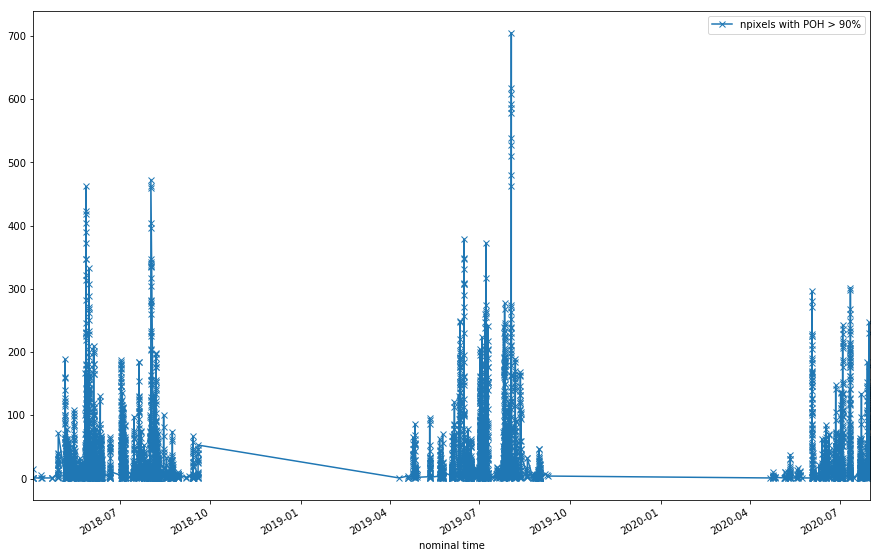

In [4]:
# Plot the evolution of the number of POH90 pixels in the daylight data
df_day.plot(x='nominal time', y='npixels with POH > 90%', marker='x', figsize=(15, 10))
plt.show()

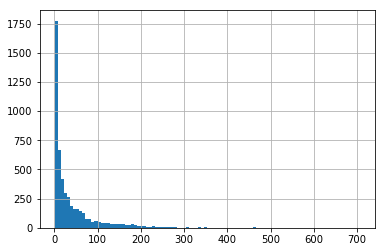

In [5]:
# Plot a histogram of the number of POH90 pixels in daylight images
df_day['npixels with POH > 90%'].hist(bins=100)
plt.show()

In [6]:
# Check how many images contain few POH90 pixels
print('Images with 1 pixel:', df_day[df_day['npixels with POH > 90%'] == 1].shape[0])
print('Images with 2 pixel:', df_day[df_day['npixels with POH > 90%'] == 2].shape[0])
print('Images with 3 pixel:', df_day[df_day['npixels with POH > 90%'] == 3].shape[0])
print('Images with 4 pixel:', df_day[df_day['npixels with POH > 90%'] == 4].shape[0])
print('Images with 5 pixel:', df_day[df_day['npixels with POH > 90%'] == 5].shape[0])

Images with 1 pixel: 430
Images with 2 pixel: 329
Images with 3 pixel: 238
Images with 4 pixel: 215
Images with 5 pixel: 157


In [7]:
df_day_aux = df_day.set_index('nominal time')
df_day_aux = df_day_aux.drop(columns='day/night')
df_day_aux.head()

,npixels with POH > 90%
nominal time,
2018-04-04 11:10:00,1.0
2018-04-04 11:20:00,1.0
2018-04-04 11:25:00,15.0
2018-04-04 11:45:00,1.0
2018-04-04 12:10:00,1.0


The visible image has a different luminosity depending on the sun elevation. Therefore knowing the diurnal cycle of POH90 pixels is relevant. From the analysis below we can conclude that most hail occurs in the afternoon. The maximum of hail pixels occurs at 15:55UTC.

In [8]:
# Number of pixels by time
by_time = df_day_aux.groupby(df_day_aux.index.time).sum()
by_time.tail()

,npixels with POH > 90%
17:35:00,2947.0
17:40:00,2526.0
17:45:00,1991.0
17:50:00,1210.0
17:55:00,916.0


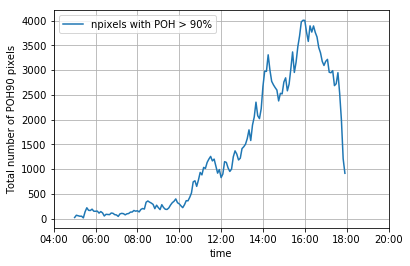

In [9]:
hourly_ticks = 60*60*np.arange(4, 21, 2)
by_time.plot(xticks = hourly_ticks)
plt.ylabel('Total number of POH90 pixels')
plt.grid()
plt.show()

In [10]:
by_time[by_time['npixels with POH > 90%'] == by_time['npixels with POH > 90%'].max()]

,npixels with POH > 90%
15:55:00,4006.0


Performing a similar analysis we can conclude that the month where most hail occurs by far is July.

In [11]:
# Number of pixels by month
by_month = df_day_aux.groupby(df_day_aux.index.month).sum()
by_month

,npixels with POH > 90%
nominal time,
4,1887.0
5,31832.0
6,42942.0
7,91402.0
8,40109.0
9,923.0


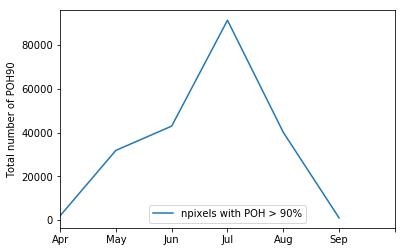

In [12]:
by_month.index = ['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep']
monthly_ticks = np.arange(7)
by_month.plot(xticks=monthly_ticks)
plt.ylabel('Total number of POH90')
plt.show()

In [13]:
# Check the 30 time steps with most POH90 pixels
df_day.sort_values(by='npixels with POH > 90%', ascending=False).head(30)

,nominal time,day/night,npixels with POH > 90%
2452,2019-08-02 11:10:00,day,705.0
2458,2019-08-02 11:40:00,day,618.0
2450,2019-08-02 11:00:00,day,608.0
2454,2019-08-02 11:20:00,day,593.0
2453,2019-08-02 11:15:00,day,586.0
2451,2019-08-02 11:05:00,day,579.0
2456,2019-08-02 11:30:00,day,538.0
2459,2019-08-02 11:45:00,day,527.0
2455,2019-08-02 11:25:00,day,511.0
2449,2019-08-02 10:55:00,day,480.0


The 30 images with most POH90 pixels correspond to just 5 days: 2019-08-02, 2018-08-01, 2018-05-27, 2019-06-15 and 2019-07-07 

2019-08-02 gets the 10 first positions of the classification. In the following we will look closer at those 5 days.

# Overview of the 5 days with most POH90 pixels

## 1) 2019-08-02

On Day 2 August 2019, the most affected area was the Po Valley. The episode was first visible at 5:45 UTC. The most intense episode lasted roughly from 9 to 14 UTC. There were several [reports](http://www.meteoweb.eu/foto/maltempo-nord-grandine-lombardia-treviso-friuli-foto-video/id/1296890/#6) in the media of large hail and wind gusts in the area 

First image:  2019-08-02 00:15:00
Last image:  2019-08-02 13:25:00


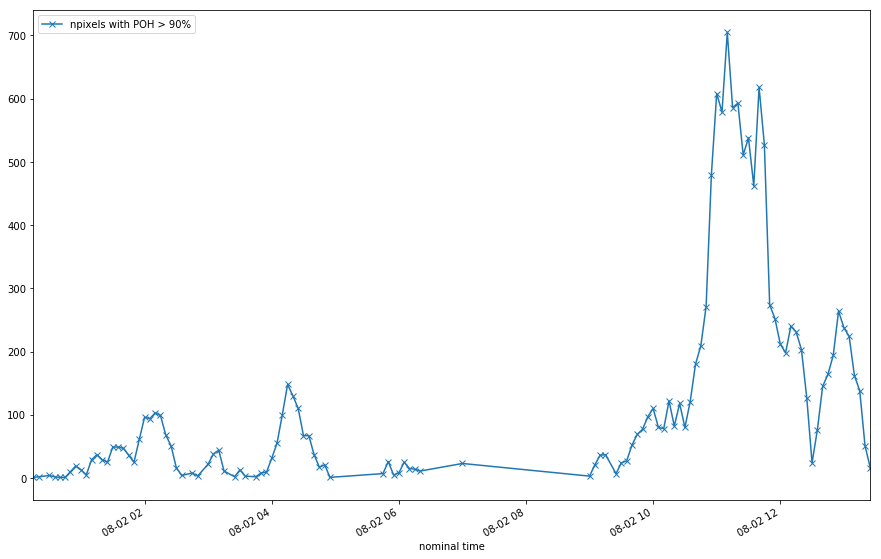

In [14]:
# Plot day 2019-08-02
df_20190802 = df[(df['nominal time']>=datetime.datetime(2019, 8, 2)) & (df['nominal time']<=datetime.datetime(2019, 8, 3))]
df_20190802.plot(x='nominal time', y='npixels with POH > 90%', marker='x', figsize=(15, 10))
print('First image: ', df_20190802['nominal time'].iloc[0])
print('Last image: ', df_20190802['nominal time'].iloc[-1])
plt.show()

<img src="20190802/POH19214.gif" align="center"/>
<img src="TRT_color_poh.gif" align="center"/>
<center><i>Daily maximum POH for day 2 August 2019<\i><\center>

The images below were taken at the moment of maximum extension of POH90. As it can be seen the areas of high POH correlate well with the "cauliflower"-shaped structure visibile in the HRV channel.

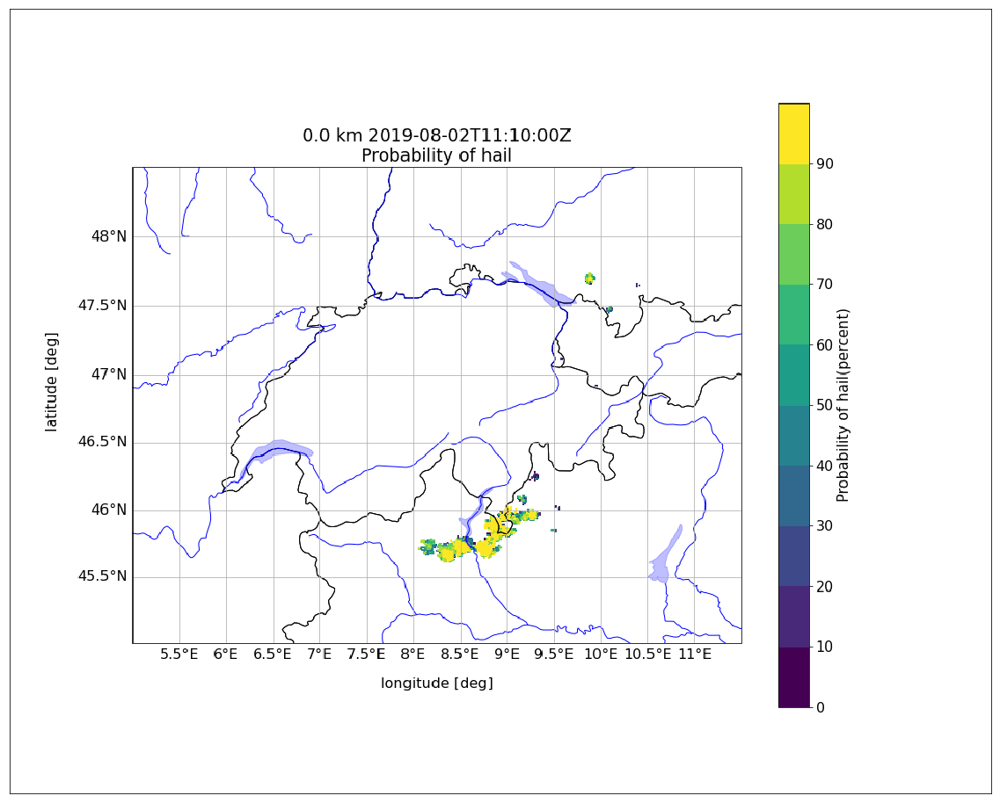

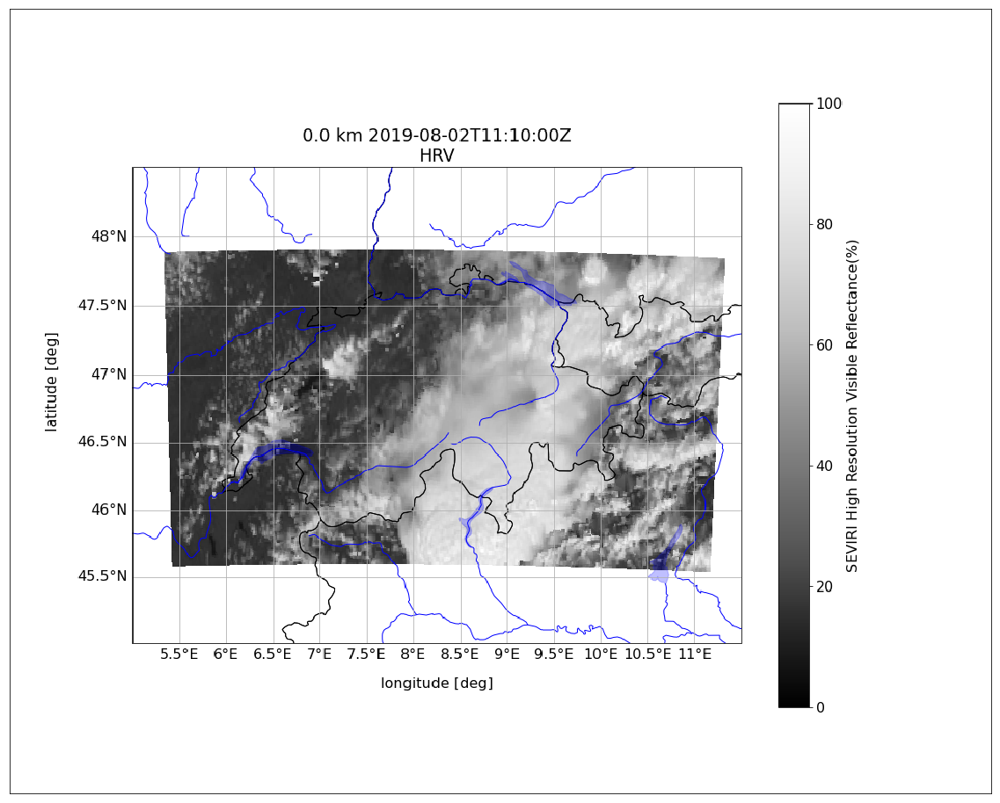

In [15]:
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(20, 20))
img = Image.open('20190802/20190802111000_surface_RAW_GRID_POH_l0.png')
ax.imshow(img)
ax.set_xticks([])
ax.set_yticks([])

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(20, 20))
img = Image.open('20190802/20190802111000_surface_RAW_GRID_HRV_l0.png')
ax.imshow(img)
ax.set_xticks([])
ax.set_yticks([])
plt.show()

We plot below the visible and near-infrared channels at the same time step as above. The HRV channel is best suited to capture the structure of the overshooting top. The VIS 0.6 $\mu m$ and VIS 0.8 $\mu m$ channel show similar structures, but are less suited due to their lower resolution. The IR 1.6 $\mu m$ channel provides information to destinguish the cloud phase. Water clouds appear brighter than ice clouds.

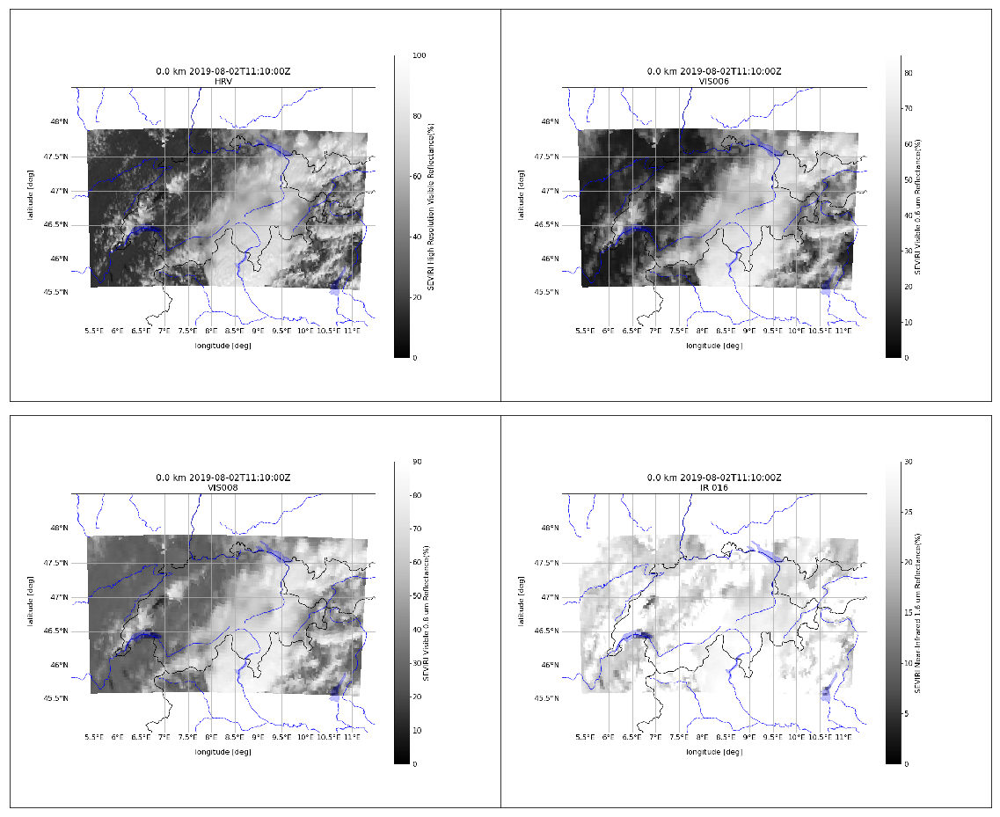

In [16]:
variable = ['HRV', 'VIS006', 'VIS008', 'IR_016']
ncols = 2
nrows = 2
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 17))

for i, var in enumerate(variable):
    img = Image.open('20190802/20190802111000_surface_RAW_GRID_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow, icol].imshow(img)
    axes[irow, icol].set_xticks([])
    axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

For completion we plot below the infrared channels. Most of them exhibit lower values in the area adjacent to the overshooting top. Therefore, they carry complementary information with respect to the HRV

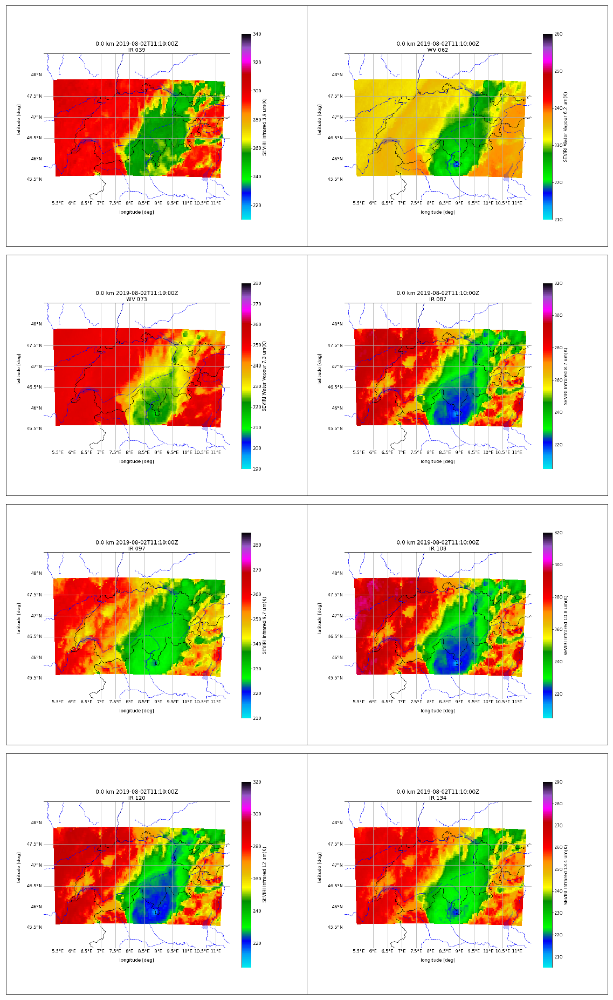

In [17]:
variable = ['IR_039', 'WV_062', 'WV_073', 'IR_087', 'IR_097', 'IR_108', 'IR_120', 'IR_134']
ncols = 2
nrows = 4
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 34))

for i, var in enumerate(variable):
    img = Image.open('20190802/20190802111000_surface_RAW_GRID_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow, icol].imshow(img)
    axes[irow, icol].set_xticks([])
    axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

We plot below some of the channel differences used in literature, e.g. the differences between IR 9.7, 12, 13.4 and 6.2 and 10.8. The differences between IR 9.7, 13.4 and 6.2 and 10.8 seem to correlate well with areas with overshooting tops. The differences between 12 and 10.8 is primarily used to distinguish water and ice cloud tops, which it does well, but there is no indication of the OT within the anvil.  

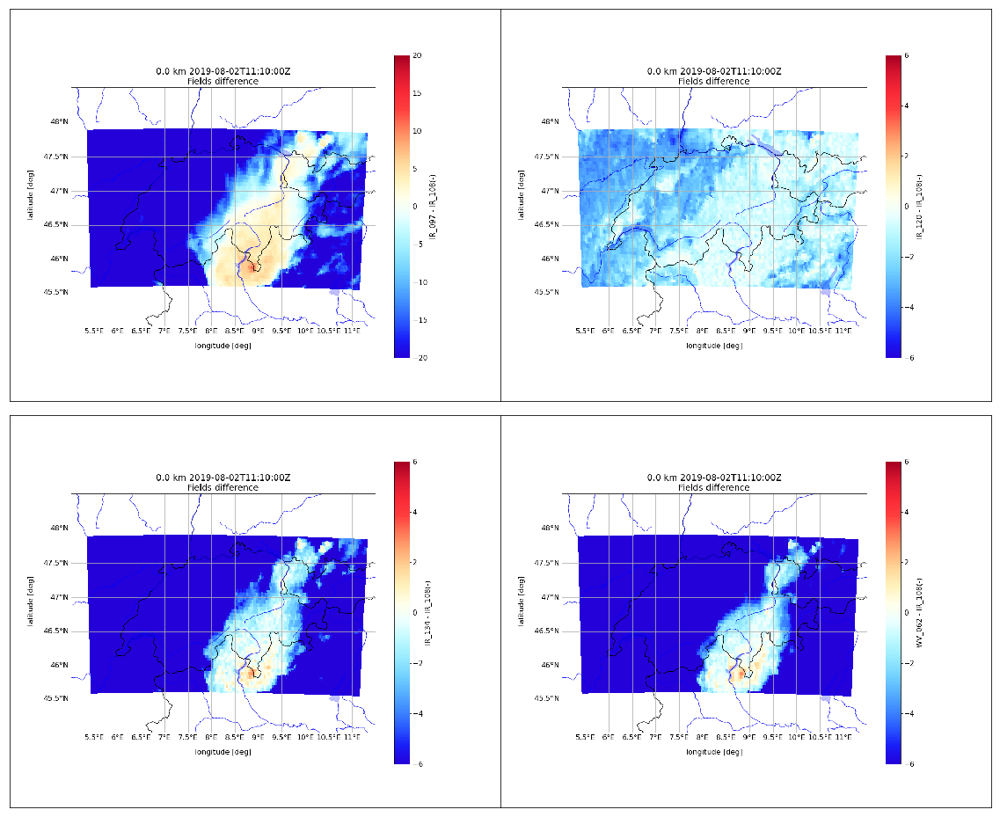

In [18]:
variable = ['IR_097-IR_108', 'IR_120-IR_108', 'IR_134-IR_108', 'WV_062-IR_108']
ncols = 2
nrows = 2
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 17))

for i, var in enumerate(variable):
    img = Image.open('20190802/20190802111000_surface_GRID_FIELDS_DIFF_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow, icol].imshow(img)
    axes[irow, icol].set_xticks([])
    axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

Below we can see satellite imaginery with the contour of the mask at POH90 overplotted. Pixels with POH90 have been expanded by one on each side in the west-east direction and 2 on each side in the south-north direction

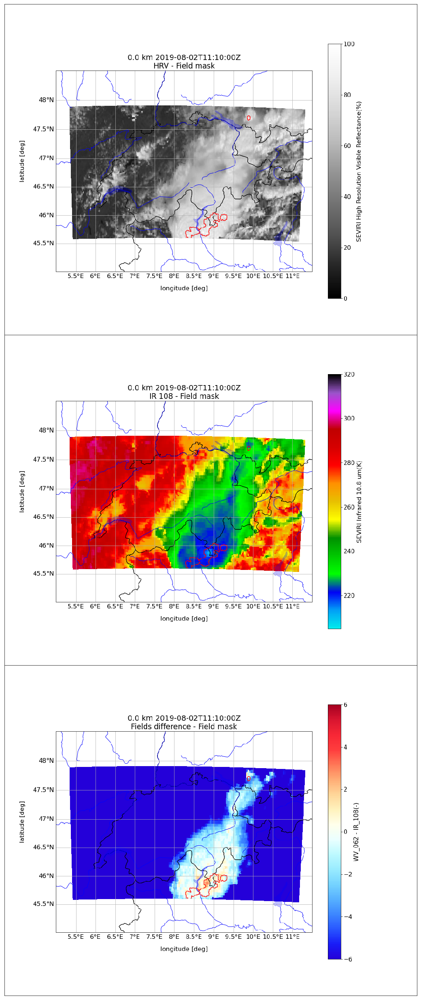

In [19]:
variable = ['HRV-mask', 'IR_108-mask', 'diff-mask']
ncols = 1
nrows = 3
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 45))

for i, var in enumerate(variable):
    img = Image.open('20190802/20190802111000_surface-contour_RAW_GRID_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow].imshow(img)
    axes[irow].set_xticks([])
    axes[irow].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

## 2) 2018-08-01

On day 1 August 2018, there was widespread hail scattered all around the area of interest, particularly abundant south of the Alps, in the area of the Como lake. The most widespread period roughly lasted from 12 to 19 UTC. 

First image:  2018-08-01 07:10:00
Last image:  2018-08-01 20:40:00


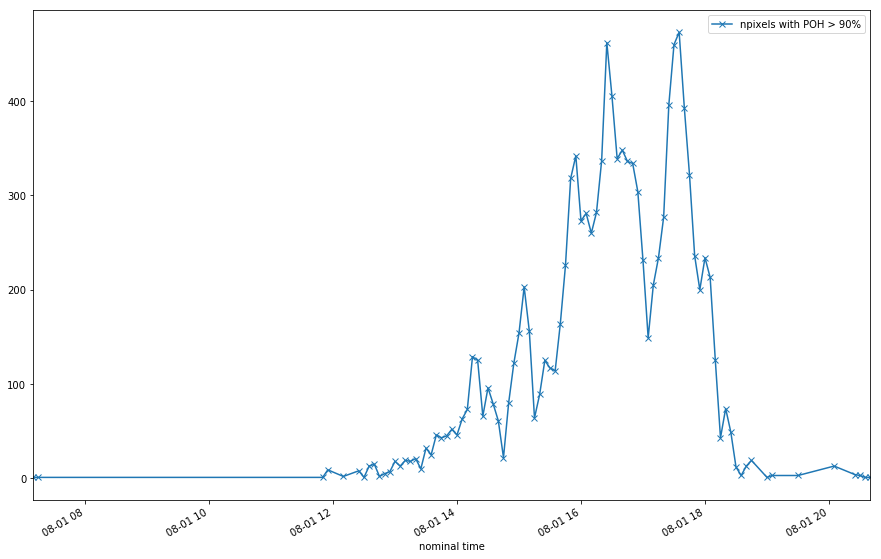

In [20]:
# Plot day 2018-08-01
df_20180801 = df[(df['nominal time']>=datetime.datetime(2018, 8, 1)) & (df['nominal time']<=datetime.datetime(2018, 8, 2))]
df_20180801.plot(x='nominal time', y='npixels with POH > 90%', marker='x', figsize=(15, 10))
print('First image: ', df_20180801['nominal time'].iloc[0])
print('Last image: ', df_20180801['nominal time'].iloc[-1])
plt.show()

<img src="20180801/POH18213.gif" align="center"/>
<img src="TRT_color_poh.gif" align="center"/>
<center><i>Daily maximum POH for day 1 August 2018<\i><\center>

The images below were taken at the moment of maximum extension of POH90. The image corresponds to a time where the sun illuminates at a low angle from the west. Overshooting tops are then seen as white-black "dipoles" with the bright side corresponding to the illuminated half of the OT and black being the shadow casted by it. Again, areas with high probability of hail correlate nicely with OTs. Note also that the whole images is much darker with respect to the images from 2019-08-02, when the sun was almost at zenith.

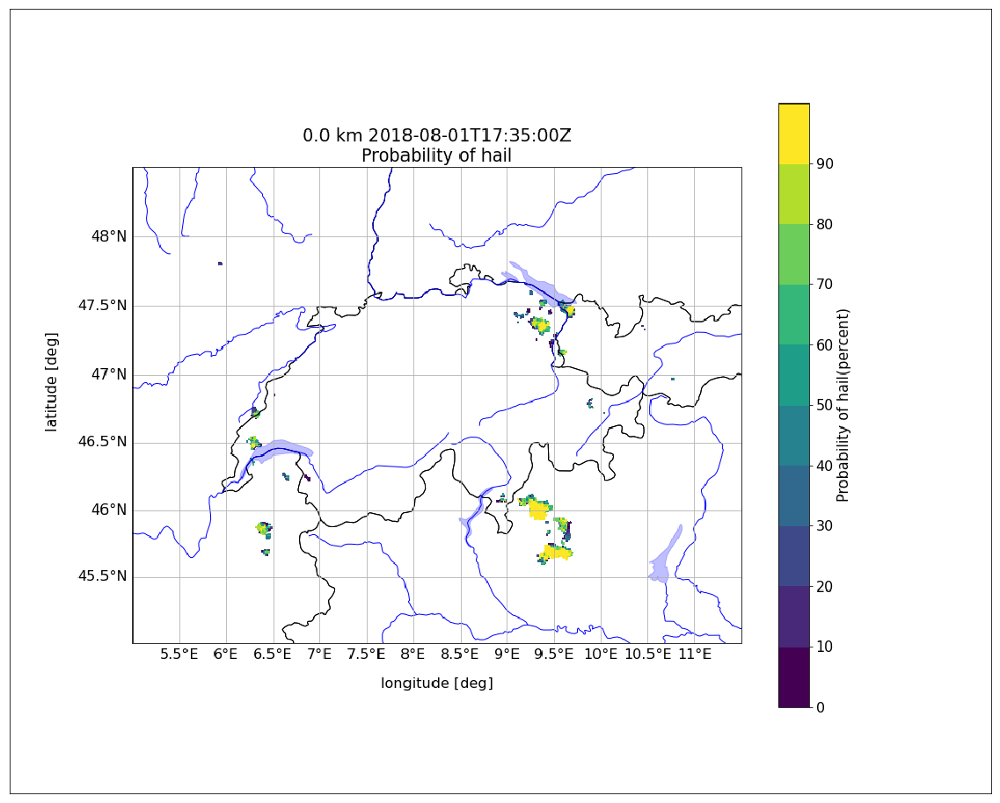

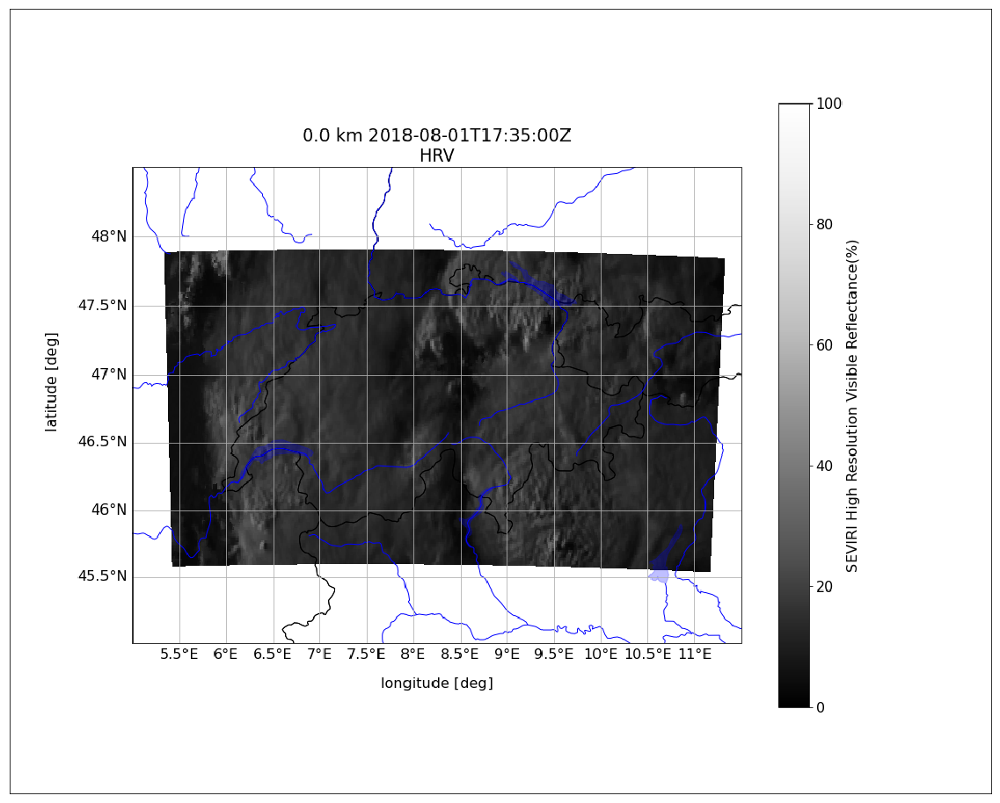

In [21]:
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(20, 20))
img = Image.open('20180801/20180801173500_surface_RAW_GRID_POH_l0.png')
ax.imshow(img)
ax.set_xticks([])
ax.set_yticks([])

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(20, 20))
img = Image.open('20180801/20180801173500_surface_RAW_GRID_HRV_l0.png')
ax.imshow(img)
ax.set_xticks([])
ax.set_yticks([])
plt.show()

We plot below the visible and near-infrared channels at the same time step as above. It is clear that the image that better capture the structure is the HRV.

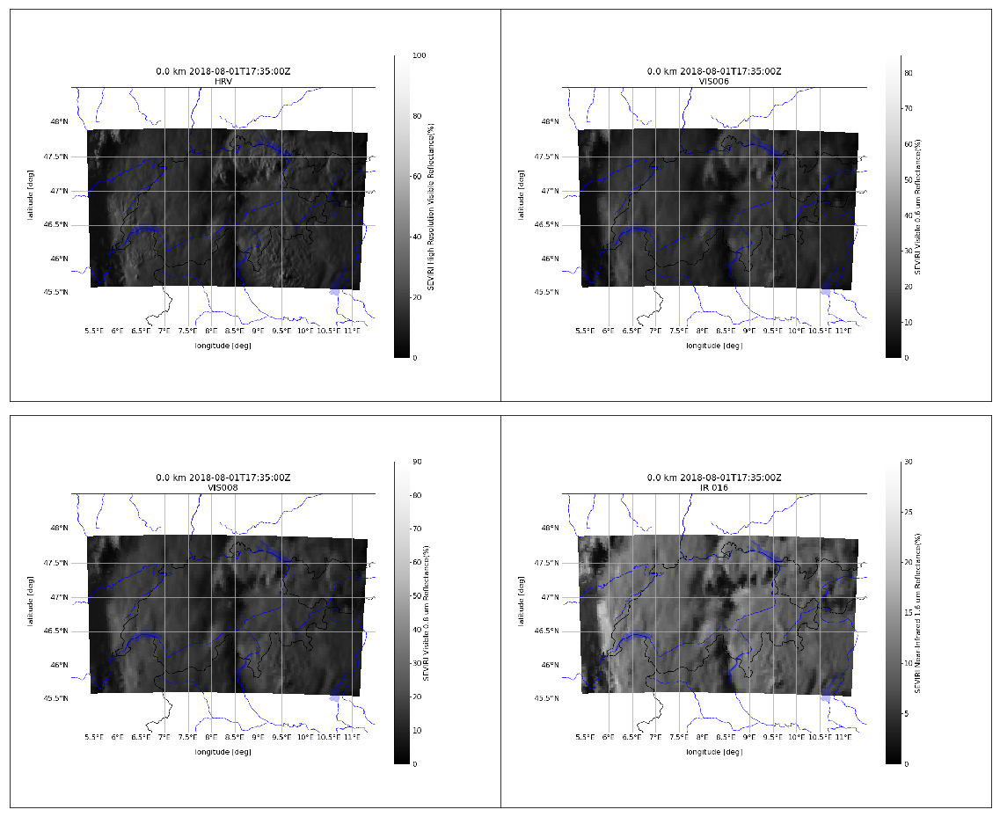

In [22]:
variable = ['HRV', 'VIS006', 'VIS008', 'IR_016']
ncols = 2
nrows = 2
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 17))

for i, var in enumerate(variable):
    img = Image.open('20180801/20180801173500_surface_RAW_GRID_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow, icol].imshow(img)
    axes[irow, icol].set_xticks([])
    axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

For completion we plot below the infrared channels. In most of them the areas with high POH exhibit lower temperatures as well. Notice that the sun illumination does not affect the values.

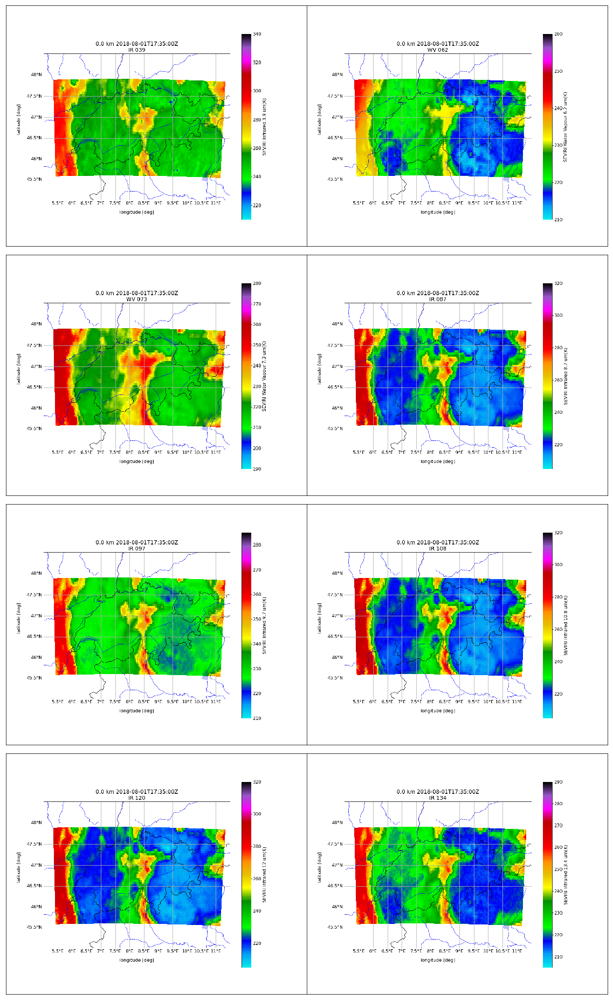

In [23]:
variable = ['IR_039', 'WV_062', 'WV_073', 'IR_087', 'IR_097', 'IR_108', 'IR_120', 'IR_134']
ncols = 2
nrows = 4
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 34))

for i, var in enumerate(variable):
    img = Image.open('20180801/20180801173500_surface_RAW_GRID_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow, icol].imshow(img)
    axes[irow, icol].set_xticks([])
    axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

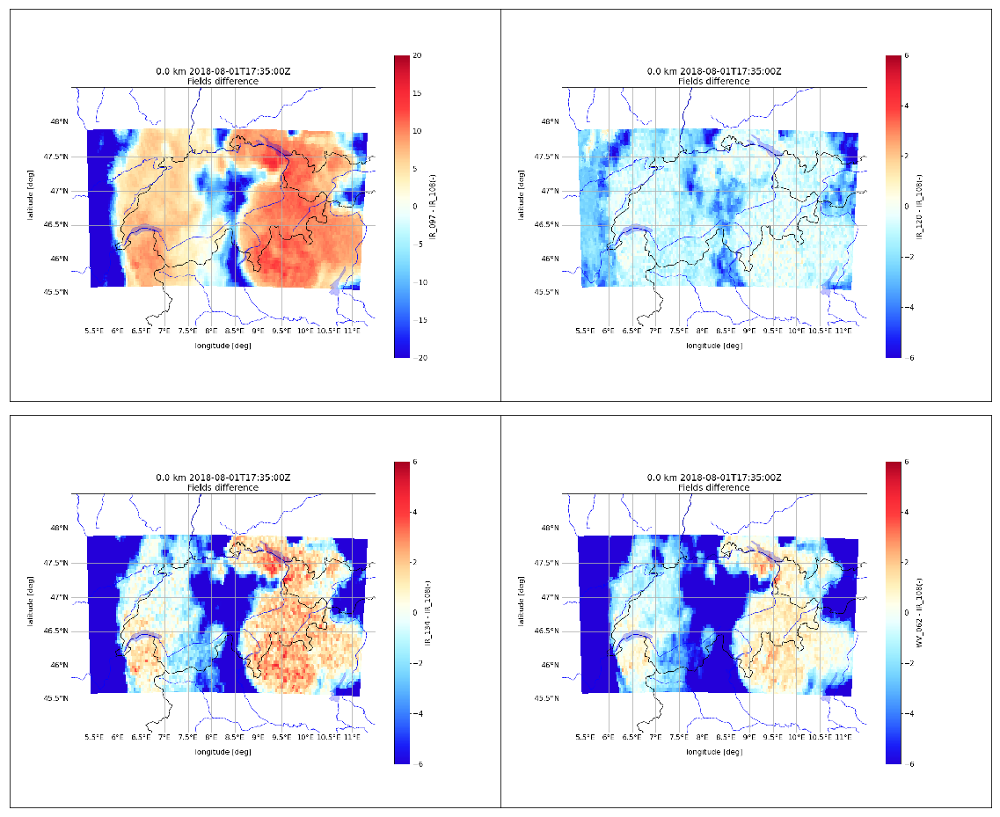

In [24]:
variable = ['IR_097-IR_108', 'IR_120-IR_108', 'IR_134-IR_108', 'WV_062-IR_108']
ncols = 2
nrows = 2
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 17))

for i, var in enumerate(variable):
    img = Image.open('20180801/20180801173500_surface_GRID_FIELDS_DIFF_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow, icol].imshow(img)
    axes[irow, icol].set_xticks([])
    axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

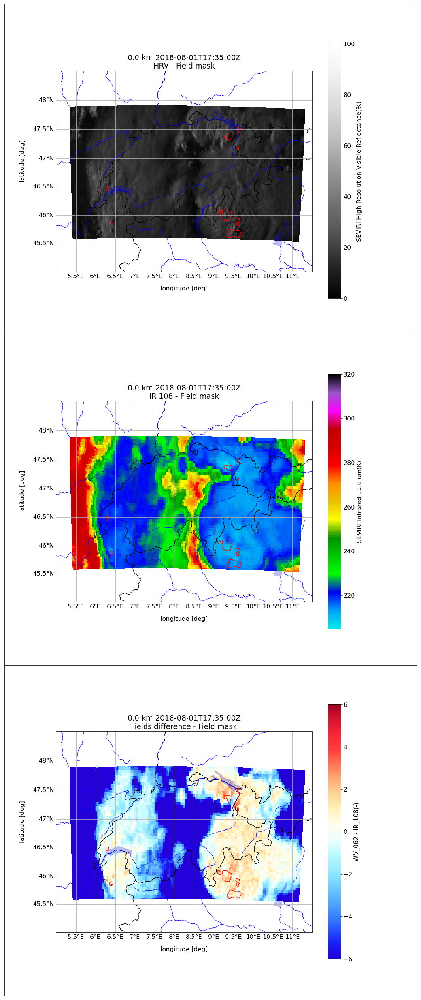

In [25]:
variable = ['HRV-mask', 'IR_108-mask', 'diff-mask']
ncols = 1
nrows = 3
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 45))

for i, var in enumerate(variable):
    img = Image.open('20180801/20180801173500_surface-contour_RAW_GRID_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow].imshow(img)
    axes[irow].set_xticks([])
    axes[irow].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

## 3) 2018-05-27

On day 27 May 2018 there was hail scattered all around the area of interest. A wide area in the Po Valley was affected. The period were POH90 pixels were more widespread was rougly from 14 to 19 UTC, although there was some level of activity over the entire day.

First image:  2018-05-27 10:55:00
Last image:  2018-05-27 23:15:00


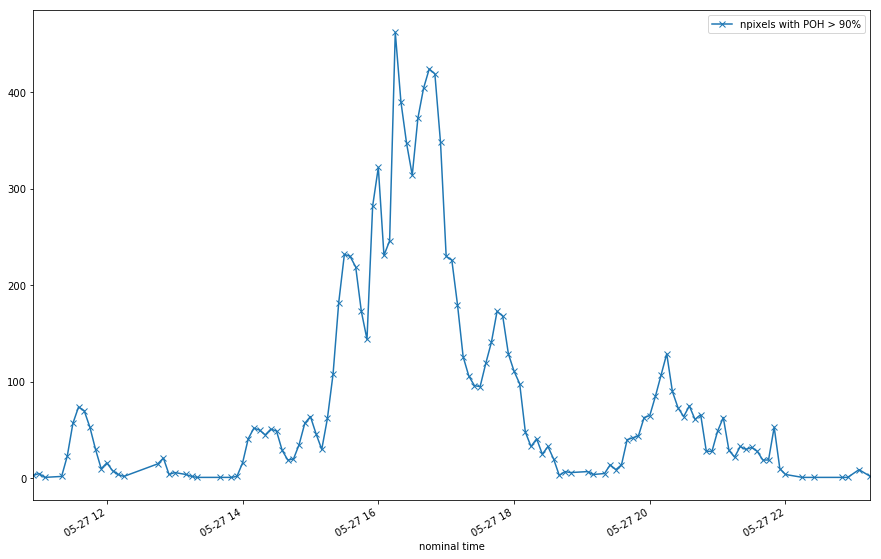

In [26]:
df_20180527 = df[(df['nominal time']>=datetime.datetime(2018, 5, 27)) & (df['nominal time']<=datetime.datetime(2018, 5, 28))]
df_20180527.plot(x='nominal time', y='npixels with POH > 90%', marker='x', figsize=(15, 10))
print('First image: ', df_20180527['nominal time'].iloc[0])
print('Last image: ', df_20180527['nominal time'].iloc[-1])
plt.show()

<img src="20180527/POH18147.gif" align="center"/>
<img src="TRT_color_poh.gif" align="center"/>
<center><i>Daily maximum POH for day 27 May 2018<\i><\center>

The images below were taken at the moment of maximum extension of POH90. As it can be seen the areas of high POH correlate well with the "cauliflower"-shaped structure visibile in the HRV channel.

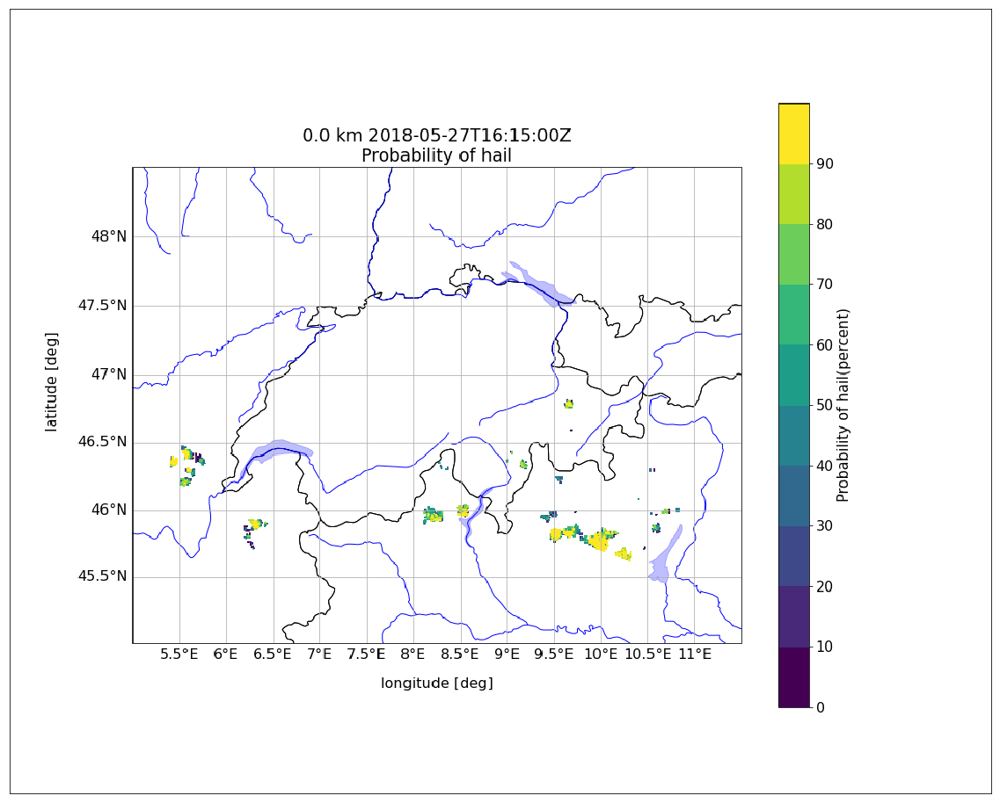

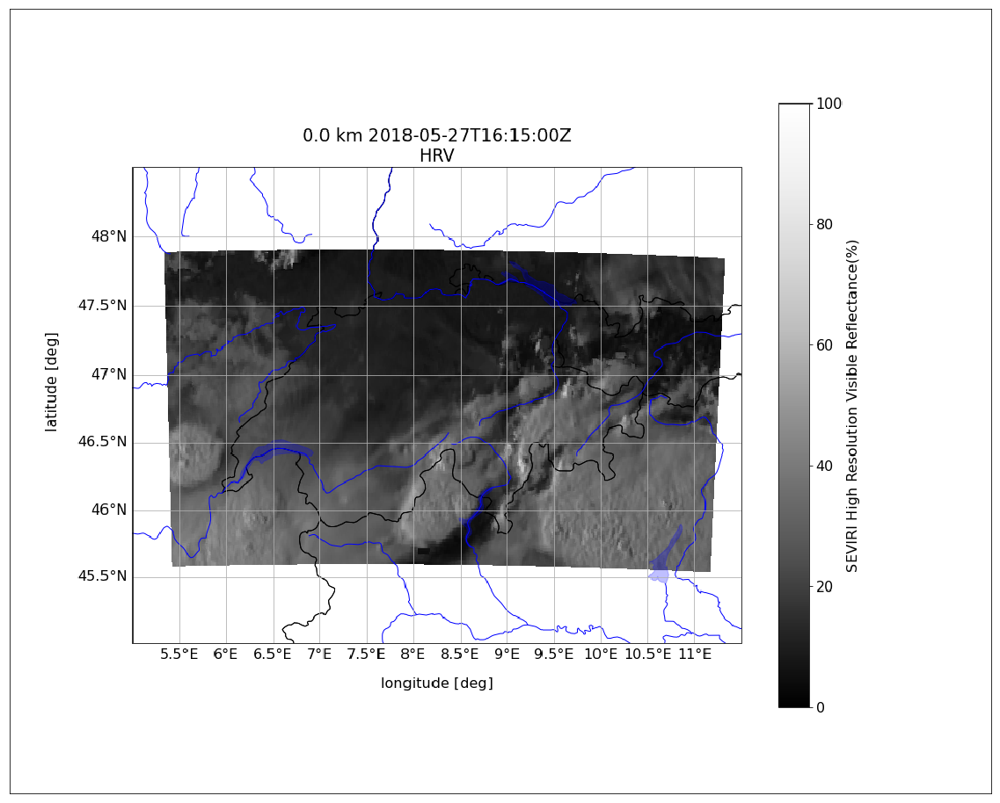

In [27]:
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(20, 20))
img = Image.open('20180527/20180527161500_surface_RAW_GRID_POH_l0.png')
ax.imshow(img)
ax.set_xticks([])
ax.set_yticks([])

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(20, 20))
img = Image.open('20180527/20180527161500_surface_RAW_GRID_HRV_l0.png')
ax.imshow(img)
ax.set_xticks([])
ax.set_yticks([])
plt.show()

We plot below the visible and near-infrared channels at the same time step as above. It is clear that the image that better capture the structure is the HRV.

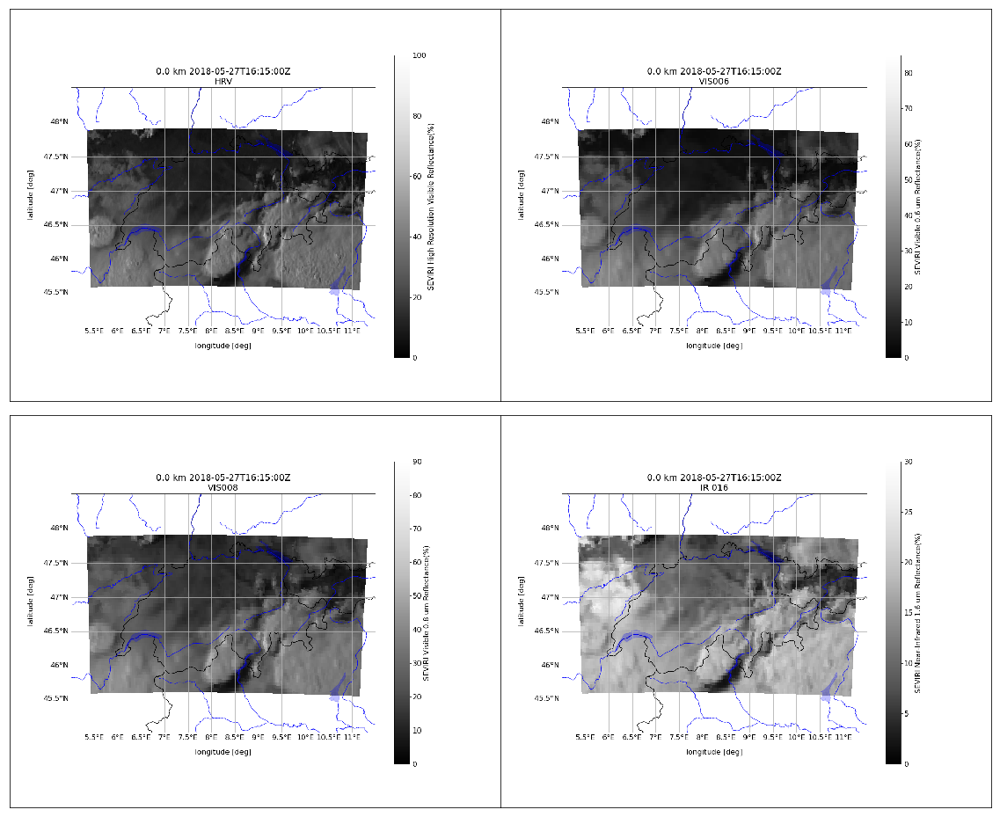

In [28]:
variable = ['HRV', 'VIS006', 'VIS008', 'IR_016']
ncols = 2
nrows = 2
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 17))

for i, var in enumerate(variable):
    img = Image.open('20180527/20180527161500_surface_RAW_GRID_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow, icol].imshow(img)
    axes[irow, icol].set_xticks([])
    axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

For completion we plot below the infrared channels. Most of them exhibit lower values in the "cauliflower"-shaped area. Therefore, they carry complementary information with respect to the HRV

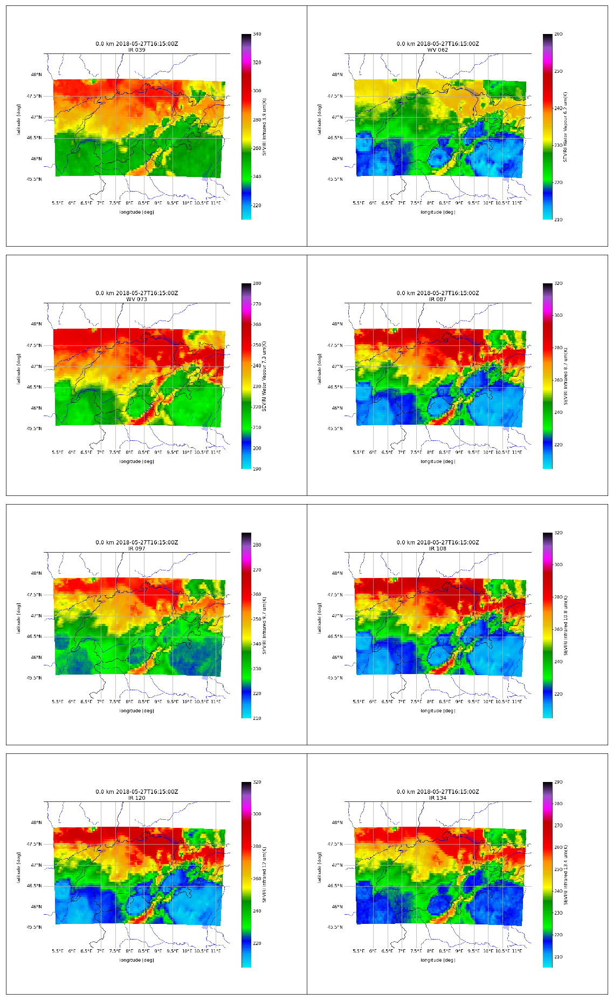

In [29]:
variable = ['IR_039', 'WV_062', 'WV_073', 'IR_087', 'IR_097', 'IR_108', 'IR_120', 'IR_134']
ncols = 2
nrows = 4
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 34))

for i, var in enumerate(variable):
    img = Image.open('20180527/20180527161500_surface_RAW_GRID_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow, icol].imshow(img)
    axes[irow, icol].set_xticks([])
    axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

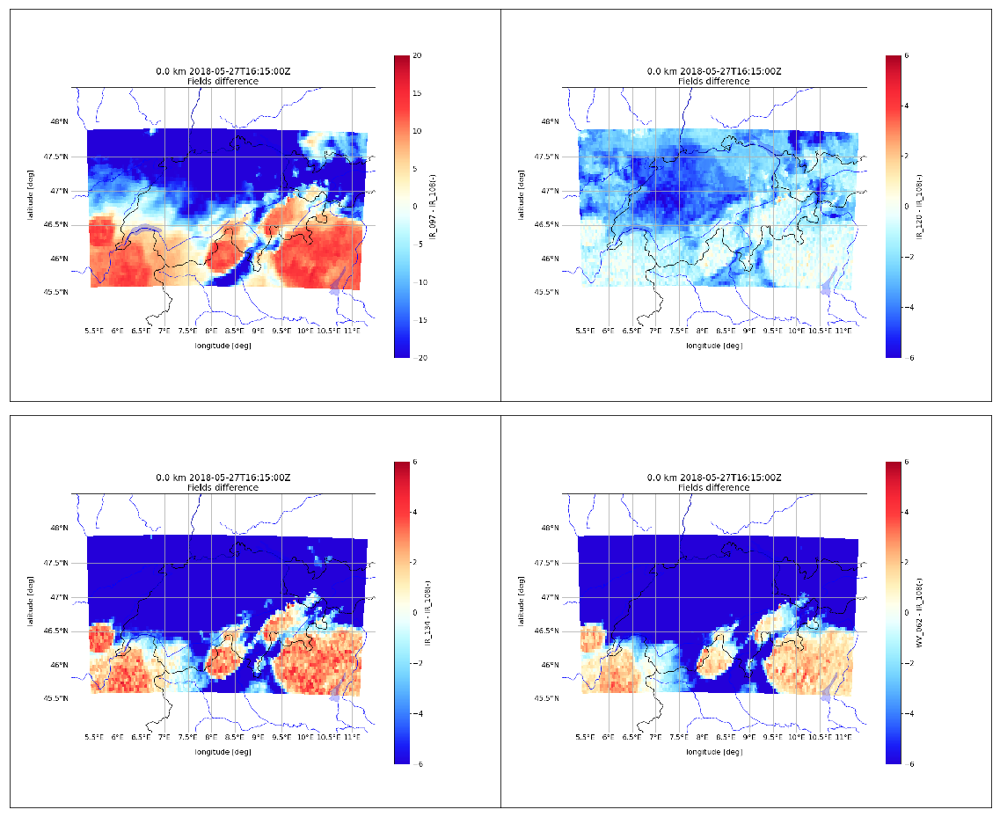

In [30]:
variable = ['IR_097-IR_108', 'IR_120-IR_108', 'IR_134-IR_108', 'WV_062-IR_108']
ncols = 2
nrows = 2
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 17))

for i, var in enumerate(variable):
    img = Image.open('20180527/20180527161500_surface_GRID_FIELDS_DIFF_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow, icol].imshow(img)
    axes[irow, icol].set_xticks([])
    axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

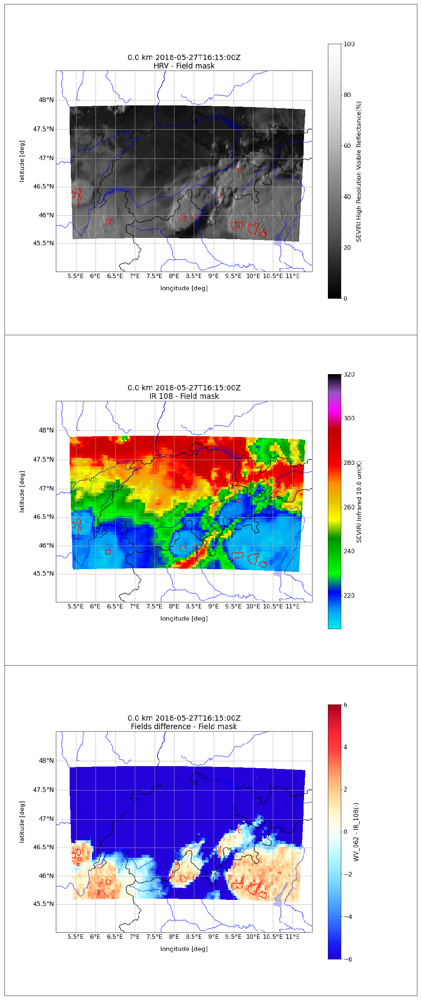

In [31]:
variable = ['HRV-mask', 'IR_108-mask', 'diff-mask']
ncols = 1
nrows = 3
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 45))

for i, var in enumerate(variable):
    img = Image.open('20180527/20180527161500_surface-contour_RAW_GRID_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow].imshow(img)
    axes[irow].set_xticks([])
    axes[irow].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

## 4) 2019-06-15

On day 15 June 2019 there were several swathes of hail. The most affected areas were around the Leman lake, the Jura and the center of Switzerland. The period with most POH90 pixels was from 14 to 18 UTC. There were several [reports](https://www.rts.ch/meteo/10512645-orages-du-15-juin-retour-sur-les-evenements.html) in the media of large hail and wind.

First image:  2019-06-15 00:00:00
Last image:  2019-06-15 22:00:00


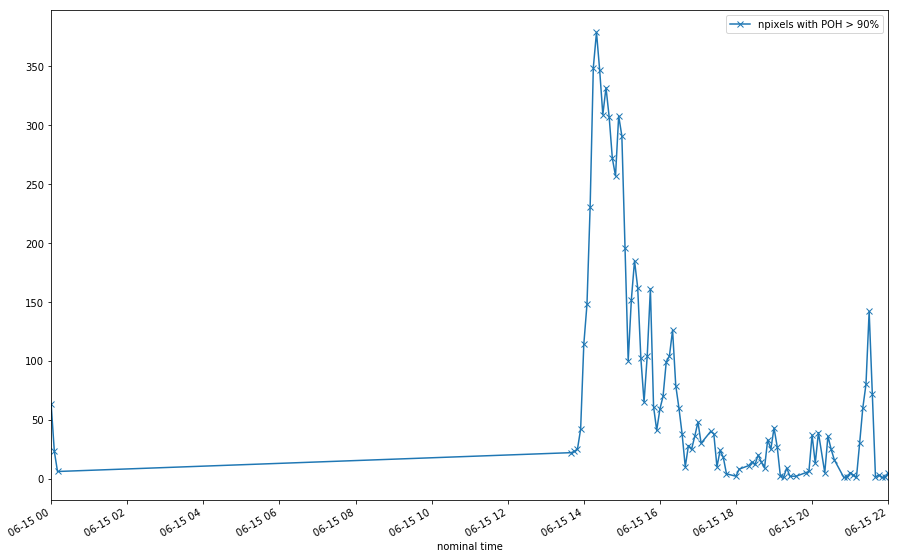

In [32]:
df_20190615 = df[(df['nominal time']>=datetime.datetime(2019, 6, 15)) & (df['nominal time']<=datetime.datetime(2019, 6, 16))]
df_20190615.plot(x='nominal time', y='npixels with POH > 90%', marker='x', figsize=(15, 10))
print('First image: ', df_20190615['nominal time'].iloc[0])
print('Last image: ', df_20190615['nominal time'].iloc[-1])
plt.show()

<img src="20190615/POH19166.gif" align="center"/>
<img src="TRT_color_poh.gif" align="center"/>
<center><i>Daily maximum POH for day 15 June 2019<\i><\center>

The images below were taken at the moment of maximum extension of POH90. As it can be seen the areas of high POH correlate well with the "cauliflower"-shaped structure visibile in the HRV channel.

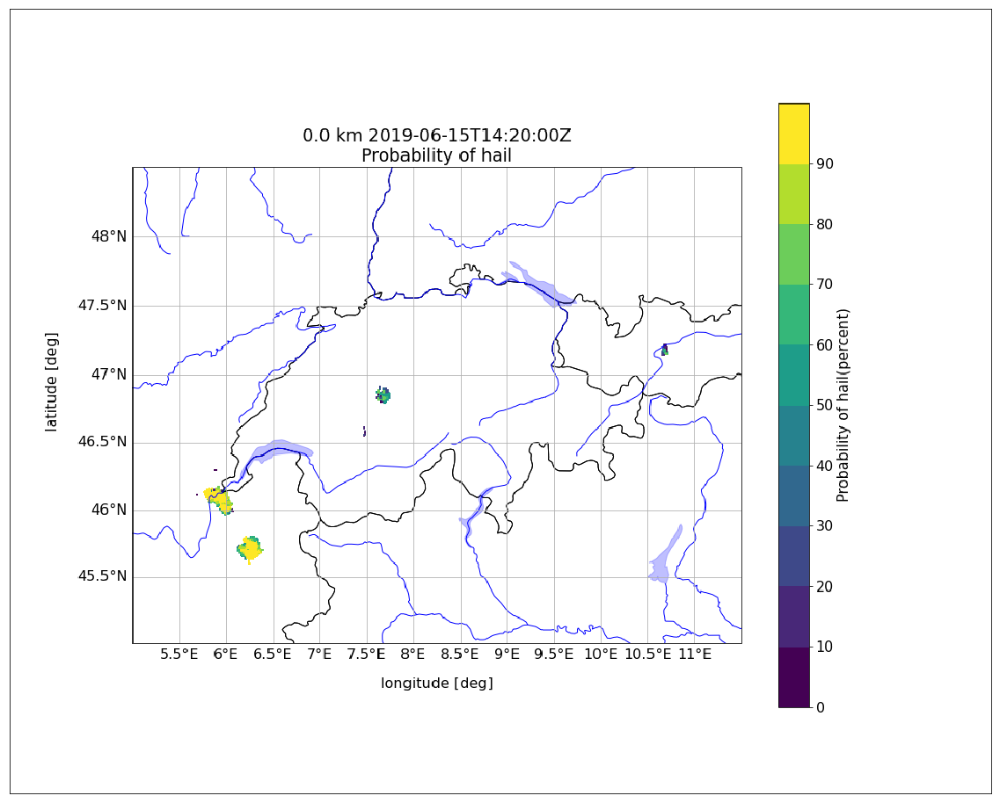

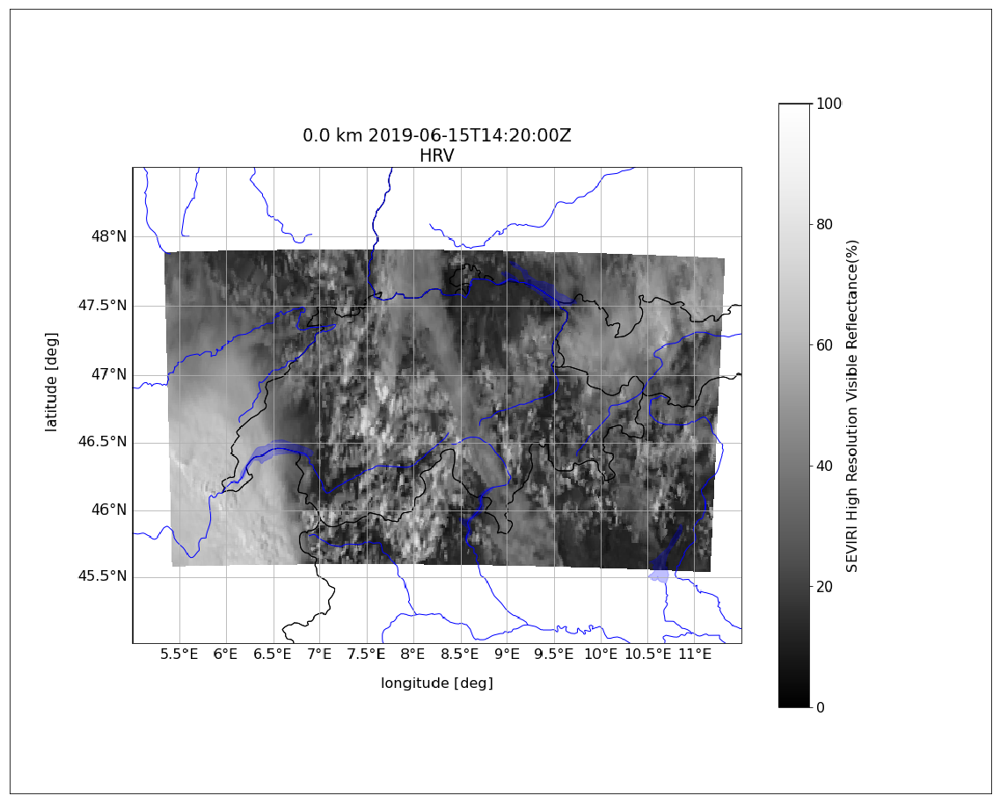

In [33]:
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(20, 20))
img = Image.open('20190615/20190615142000_surface_RAW_GRID_POH_l0.png')
ax.imshow(img)
ax.set_xticks([])
ax.set_yticks([])

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(20, 20))
img = Image.open('20190615/20190615142000_surface_RAW_GRID_HRV_l0.png')
ax.imshow(img)
ax.set_xticks([])
ax.set_yticks([])
plt.show()

We plot below the visible and near-infrared channels at the same time step as above. It is clear that the image that better capture the structure is the HRV.

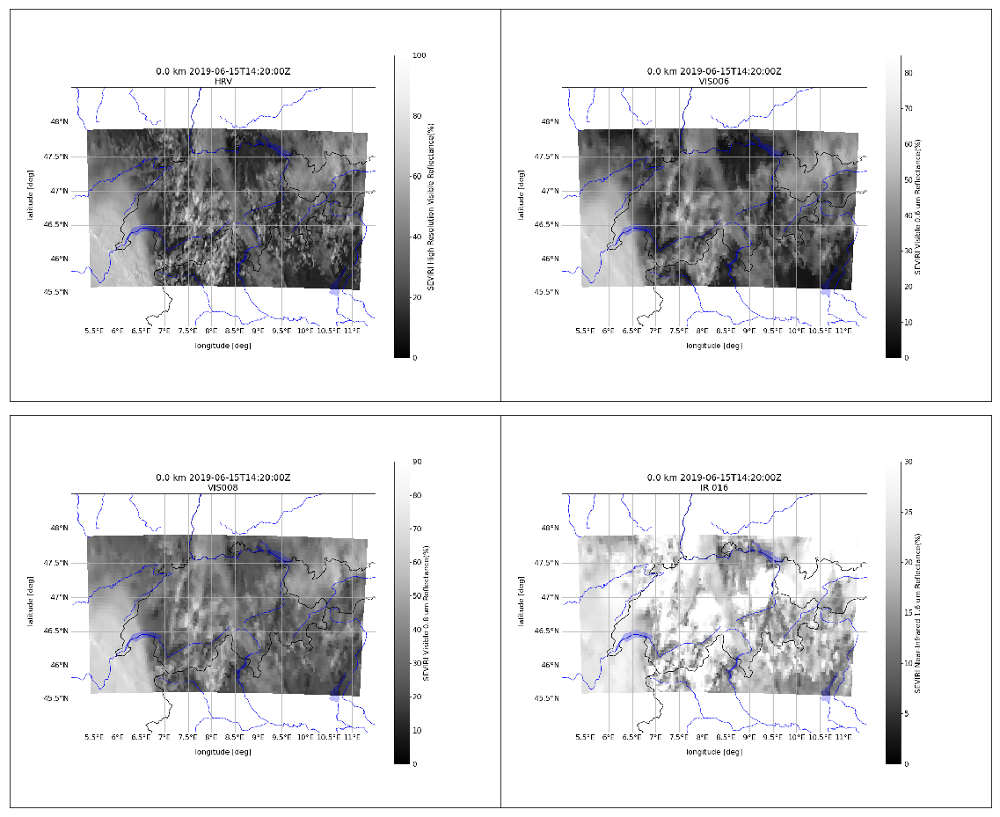

In [34]:
variable = ['HRV', 'VIS006', 'VIS008', 'IR_016']
ncols = 2
nrows = 2
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 17))

for i, var in enumerate(variable):
    img = Image.open('20190615/20190615142000_surface_RAW_GRID_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow, icol].imshow(img)
    axes[irow, icol].set_xticks([])
    axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

For completion we plot below the infrared channels. Most of them exhibit lower values in the "cauliflower"-shaped area. Therefore, they carry complementary information with respect to the HRV

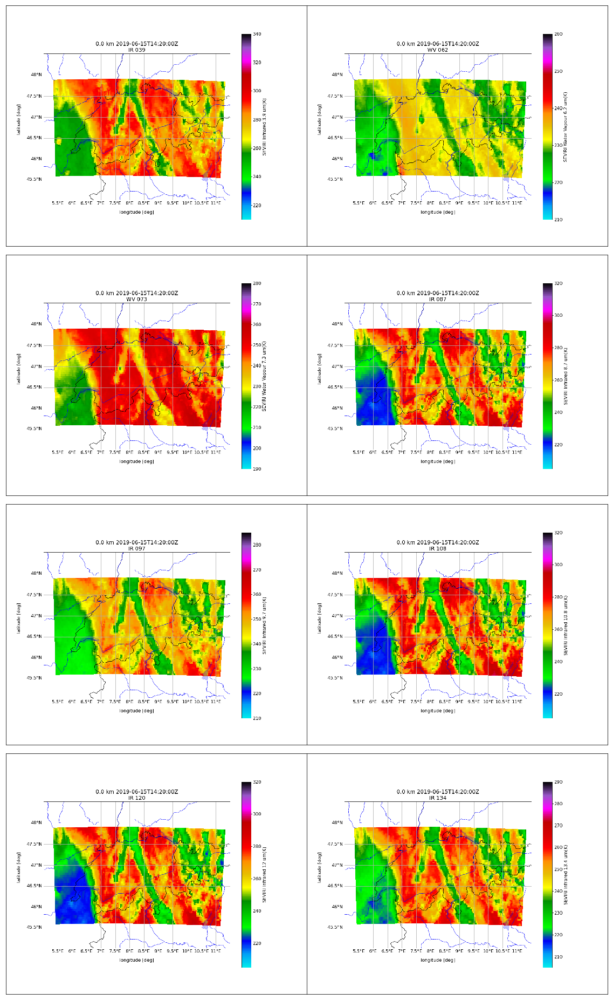

In [35]:
variable = ['IR_039', 'WV_062', 'WV_073', 'IR_087', 'IR_097', 'IR_108', 'IR_120', 'IR_134']
ncols = 2
nrows = 4
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 34))

for i, var in enumerate(variable):
    img = Image.open('20190615/20190615142000_surface_RAW_GRID_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow, icol].imshow(img)
    axes[irow, icol].set_xticks([])
    axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

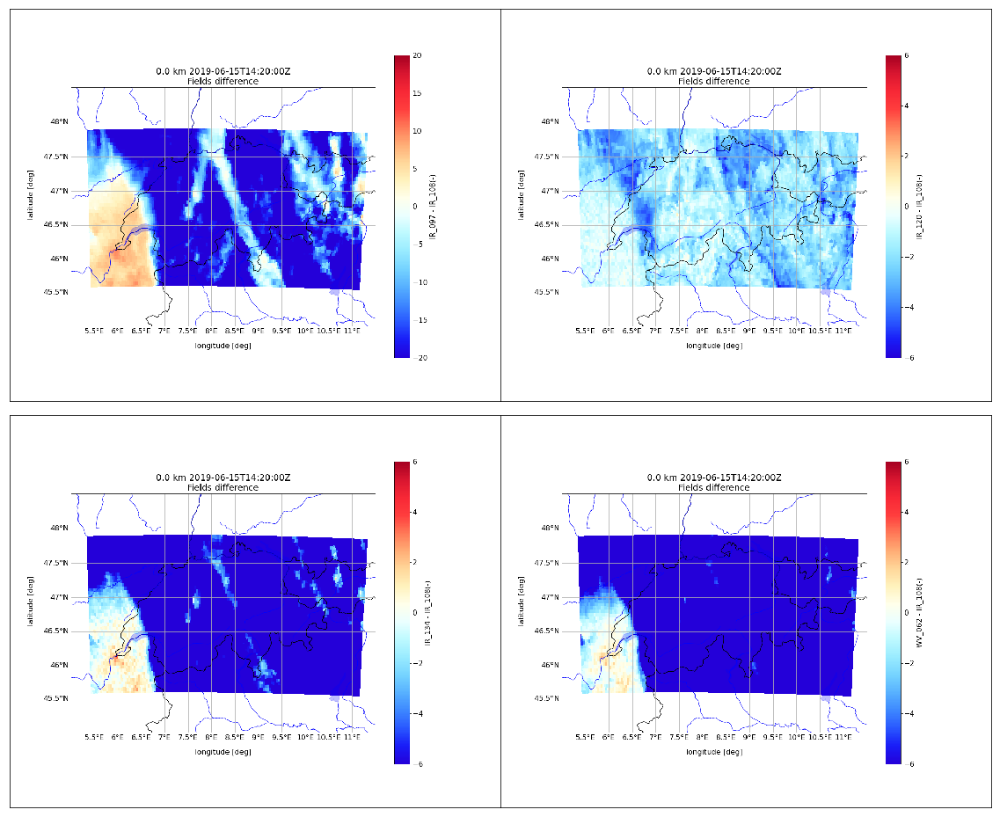

In [36]:
variable = ['IR_097-IR_108', 'IR_120-IR_108', 'IR_134-IR_108', 'WV_062-IR_108']
ncols = 2
nrows = 2
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 17))

for i, var in enumerate(variable):
    img = Image.open('20190615/20190615142000_surface_GRID_FIELDS_DIFF_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow, icol].imshow(img)
    axes[irow, icol].set_xticks([])
    axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

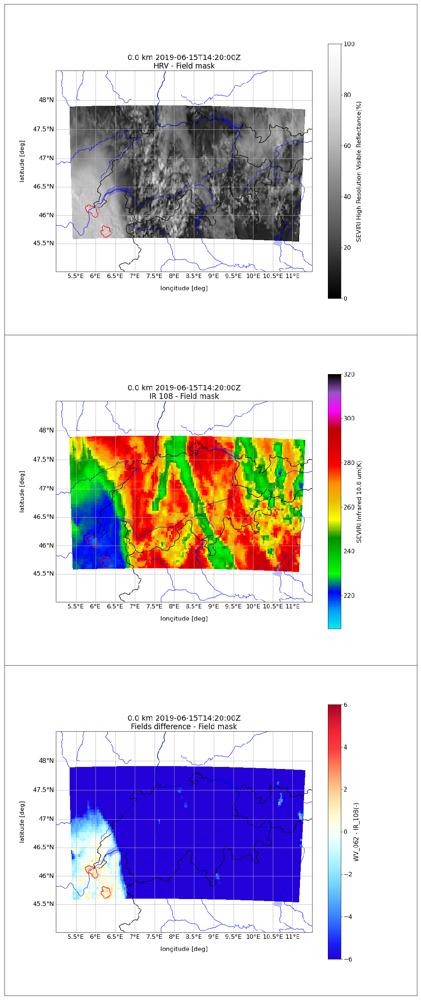

In [37]:
variable = ['HRV-mask', 'IR_108-mask', 'diff-mask']
ncols = 1
nrows = 3
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 45))

for i, var in enumerate(variable):
    img = Image.open('20190615/20190615142000_surface-contour_RAW_GRID_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow].imshow(img)
    axes[irow].set_xticks([])
    axes[irow].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

## 5) 2019-07-07

On day 7 July 2019 there were swathes of hail both Nort and South of the Alps. Two periods of hail can be distinguished. One happening in the early hours of the day and another with more widespread hail going from roughly 12 to 17 UTC.

First image:  2019-07-07 00:05:00
Last image:  2019-07-07 16:45:00


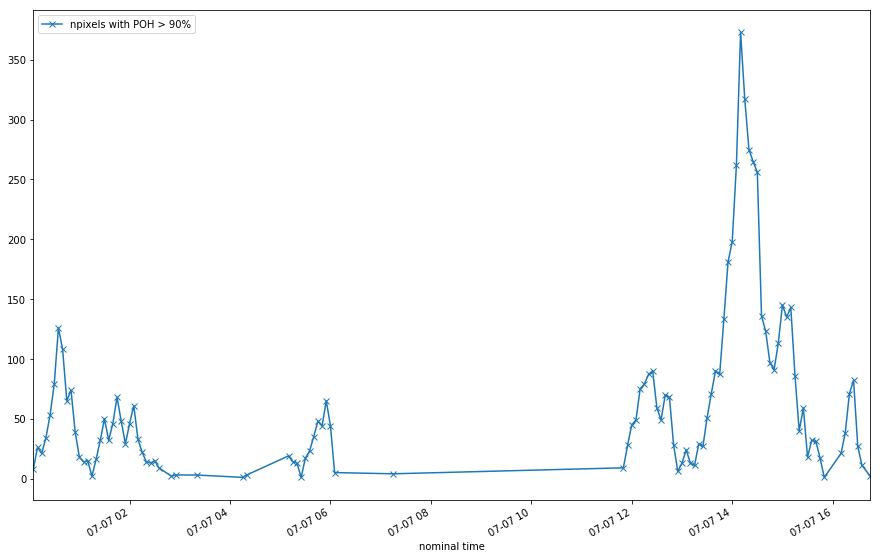

In [38]:
df_20190707 = df[(df['nominal time']>=datetime.datetime(2019, 7, 7)) & (df['nominal time']<=datetime.datetime(2019, 7, 8))]
df_20190707.plot(x='nominal time', y='npixels with POH > 90%', marker='x', figsize=(15, 10))
print('First image: ', df_20190707['nominal time'].iloc[0])
print('Last image: ', df_20190707['nominal time'].iloc[-1])
plt.show()

<img src="20190707/POH19188.gif" align="center"/>
<img src="TRT_color_poh.gif" align="center"/>
<center><i>Daily maximum POH for day 7 July 2019<\i><\center>

The images below were taken at the moment of maximum extension of POH90. As it can be seen the areas of high POH correlate well with the "cauliflower"-shaped structure visibile in the HRV channel.

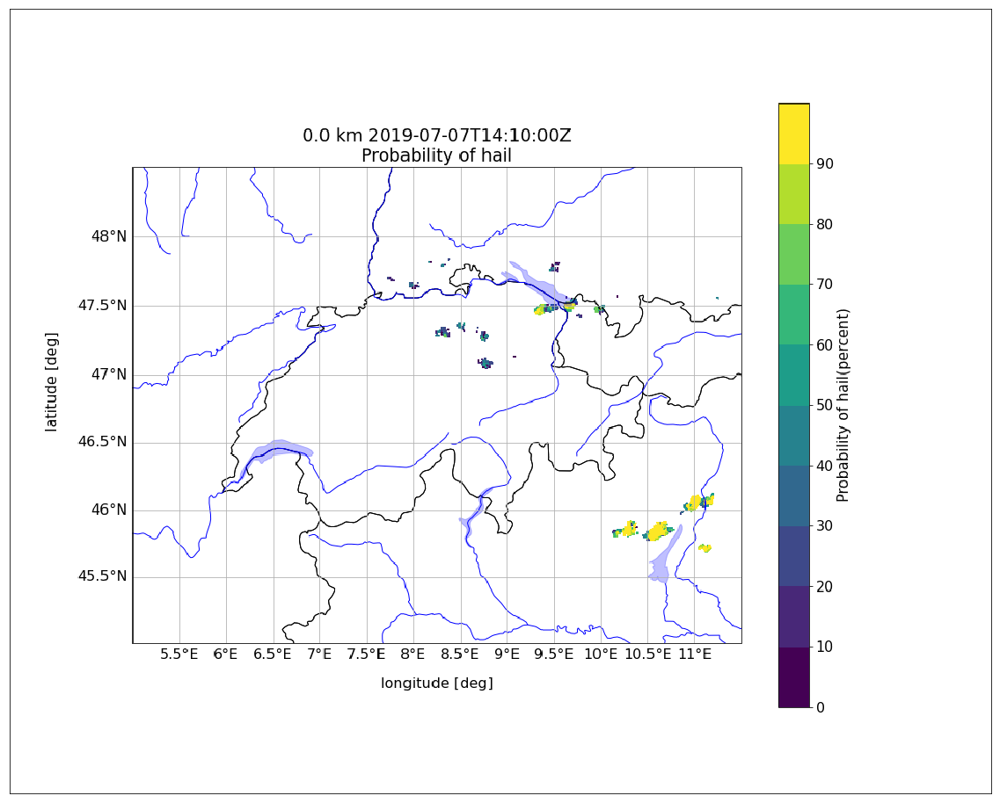

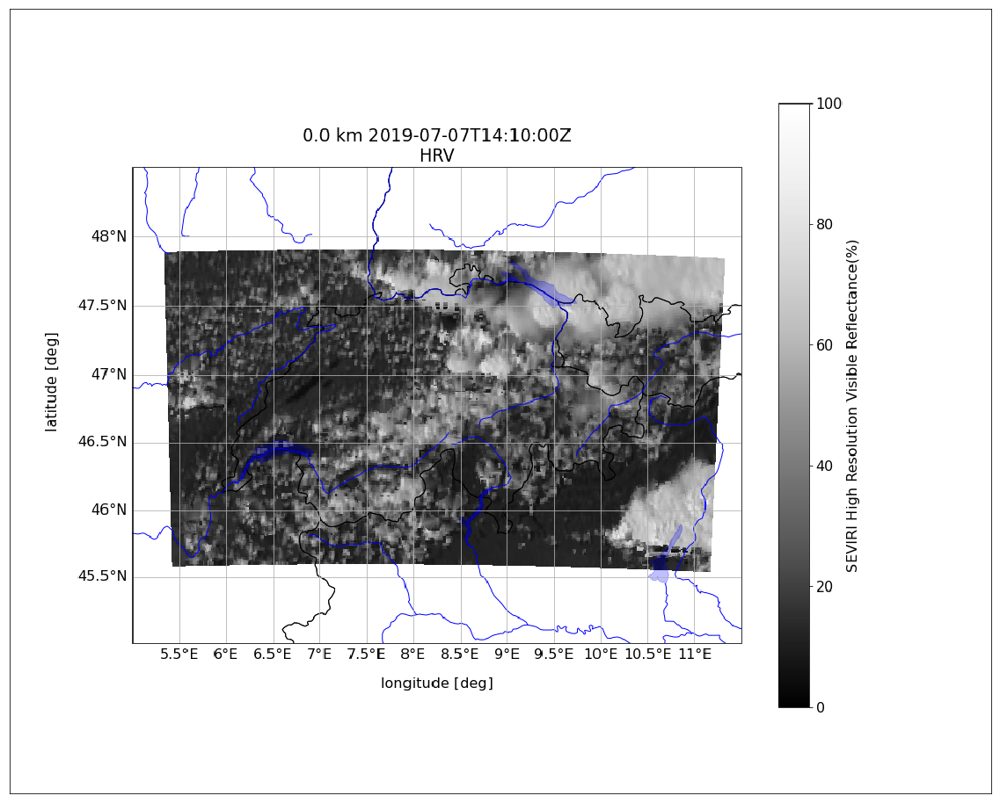

In [39]:
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(20, 20))
img = Image.open('20190707/20190707141000_surface_RAW_GRID_POH_l0.png')
ax.imshow(img)
ax.set_xticks([])
ax.set_yticks([])

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(20, 20))
img = Image.open('20190707/20190707141000_surface_RAW_GRID_HRV_l0.png')
ax.imshow(img)
ax.set_xticks([])
ax.set_yticks([])
plt.show()

We plot below the visible and near-infrared channels at the same time step as above. It is clear that the image that better capture the structure is the HRV.

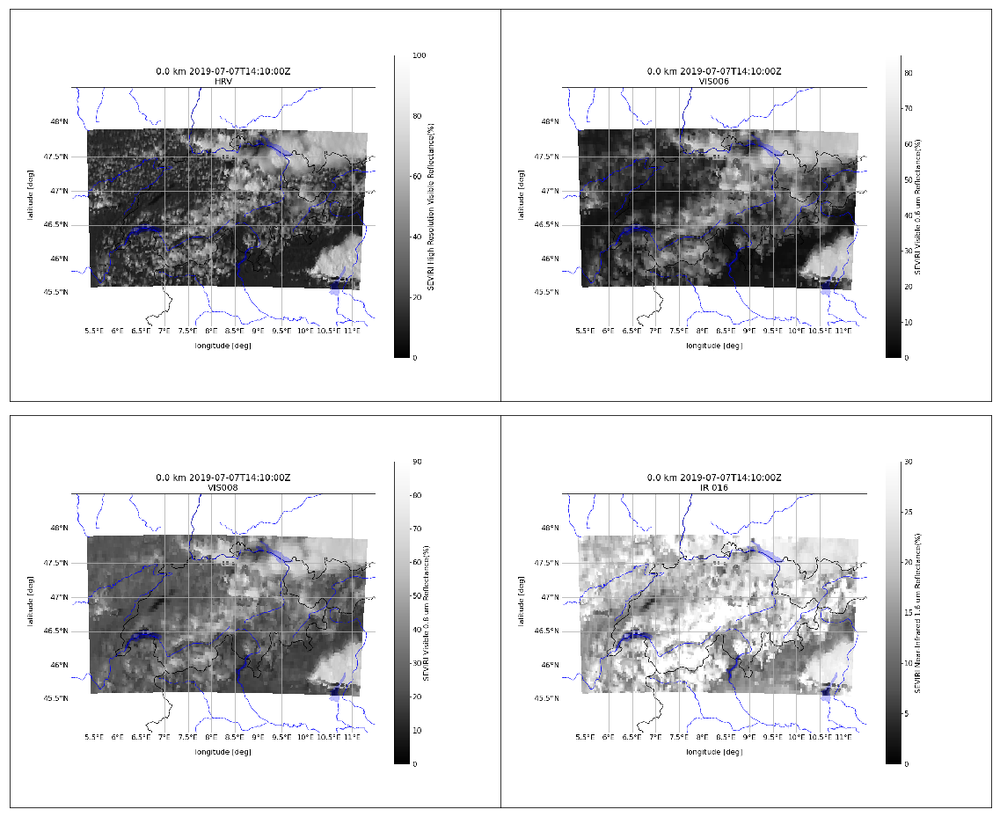

In [40]:
variable = ['HRV', 'VIS006', 'VIS008', 'IR_016']
ncols = 2
nrows = 2
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 17))

for i, var in enumerate(variable):
    img = Image.open('20190707/20190707141000_surface_RAW_GRID_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow, icol].imshow(img)
    axes[irow, icol].set_xticks([])
    axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

For completion we plot below the infrared channels. Most of them exhibit lower values in the "cauliflower"-shaped area. Therefore, they carry complementary information with respect to the HRV

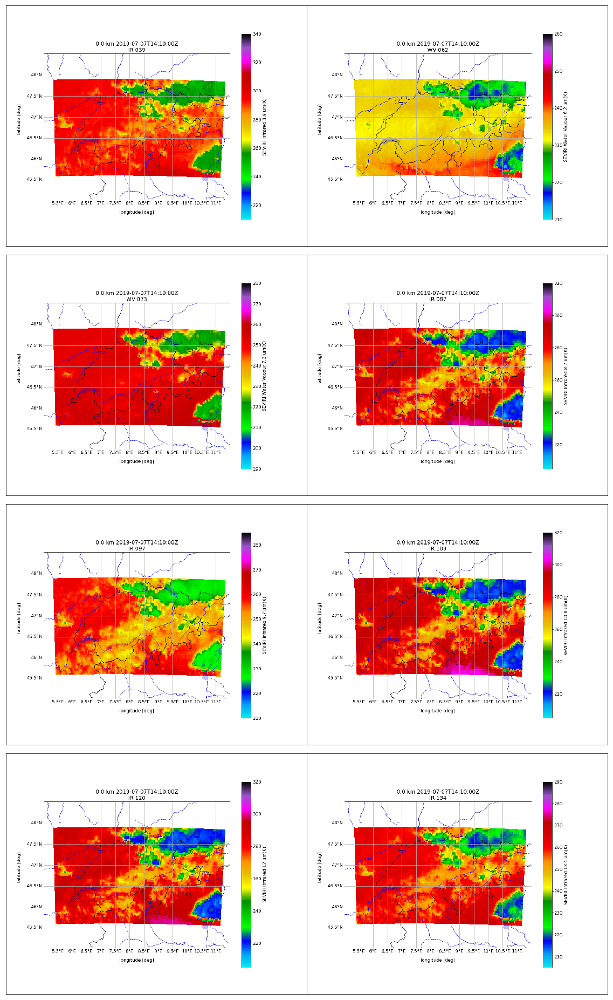

In [41]:
variable = ['IR_039', 'WV_062', 'WV_073', 'IR_087', 'IR_097', 'IR_108', 'IR_120', 'IR_134']
ncols = 2
nrows = 4
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 34))

for i, var in enumerate(variable):
    img = Image.open('20190707/20190707141000_surface_RAW_GRID_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow, icol].imshow(img)
    axes[irow, icol].set_xticks([])
    axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

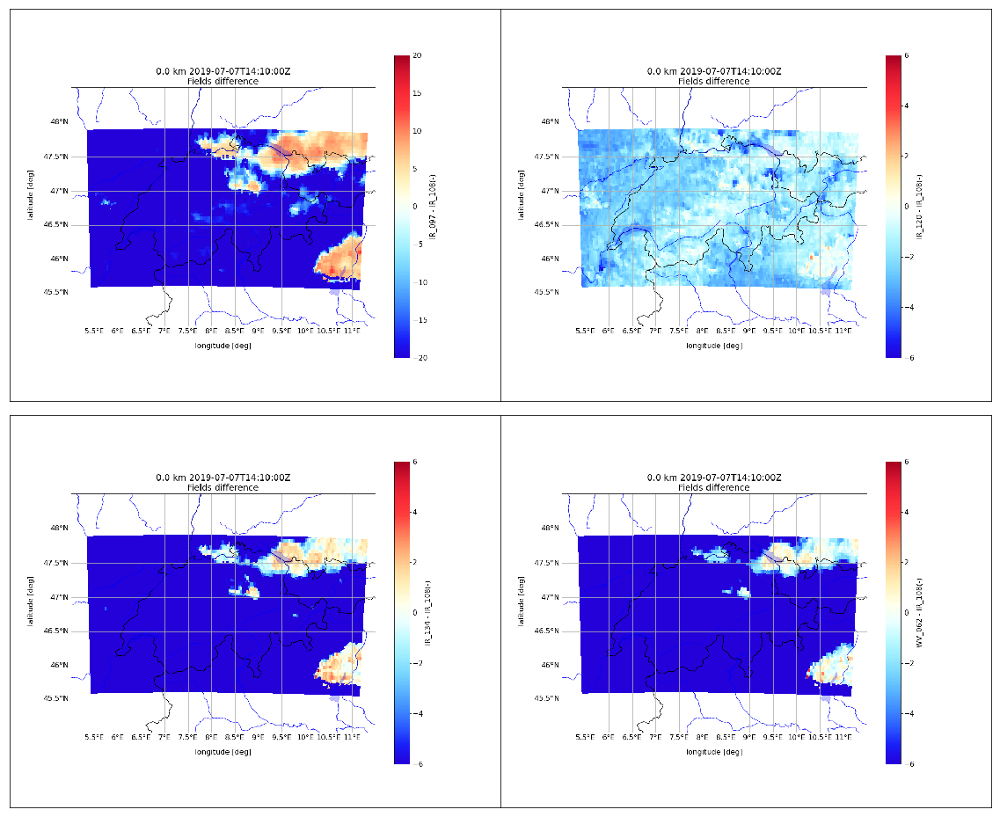

In [42]:
variable = ['IR_097-IR_108', 'IR_120-IR_108', 'IR_134-IR_108', 'WV_062-IR_108']
ncols = 2
nrows = 2
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 17))

for i, var in enumerate(variable):
    img = Image.open('20190707/20190707141000_surface_GRID_FIELDS_DIFF_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow, icol].imshow(img)
    axes[irow, icol].set_xticks([])
    axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

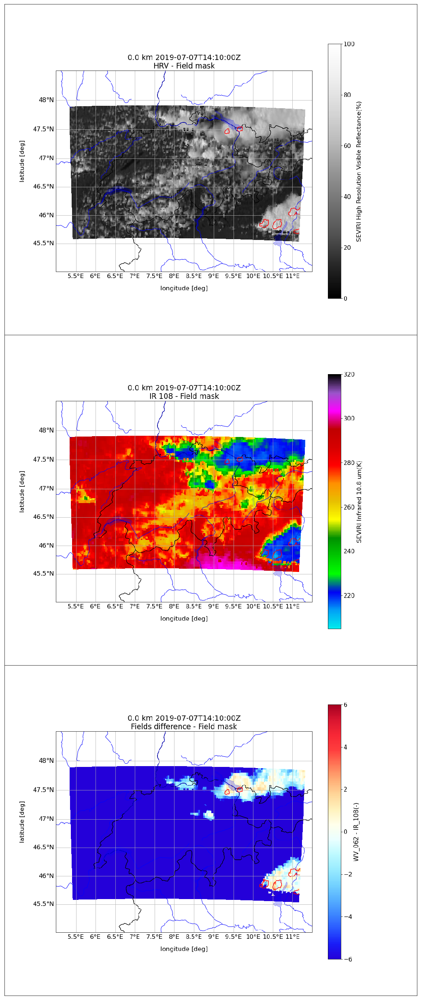

In [43]:
variable = ['HRV-mask', 'IR_108-mask', 'diff-mask']
ncols = 1
nrows = 3
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 45))

for i, var in enumerate(variable):
    img = Image.open('20190707/20190707141000_surface-contour_RAW_GRID_'+var+'_l0.png')
    irow = int(i/ncols)
    icol = int(i%ncols)
    axes[irow].imshow(img)
    axes[irow].set_xticks([])
    axes[irow].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

# Histograms of the data

We explore here the histograms of the data for the 3 channels that contain most information on hail, that is the infrared 10.8 the difference between water vapour and the infrared 10.8 and the high resolution visible (non-normalized and normalized by the sun position). For convinence we have divided the data in 512 bins with ample margins instead of the quantization to 10 bits from the original data.

First we comment on the histograms resulting from pooling all the data together (first column in the figures below). IR_108 data exhibits a bimodality with one peak at roughly 230 K and the other at 290K. The data range expands from 202 to 311 K. The channel differences has 2 picks at roughly -60 K and 0 K and a secondary one at 40 K. The data range expands from -78 K to 8.4 K. The high resolution visible channel exhibits a log-normal distribution with the peak roughly at 15%. When normalized by the sun position, a very clear peak at around 20% clearly emerges. A second peak at 100% can be seen which clearly indicates that a large percentage of the data becomes saturated when normalizing.

Due to the fact that a very large percentage of the pixels in the images do not contain hail there are no visible differences between the histograms of all the data pulled together and that of no-hail data. The pixels containing hail are characterized by low values of IR_108. The distribution has a log-normal shape with a peak at roughly 215 K and a large tail. The range of values in the histogram extends from 202 to 295 K. The channel differences has a very large peak at 0.8 K. On the positive differences it decreases very rapidly up to the range of 8.4 K whereas the negative side has a fat tail reaching -63.2 K. The HRV channel has an almost uniform distribution between 20 and 80%, however when normalized by the sun position the distribution becomes Gaussian with a peak at 90% and many values above 100%. In the plot this shows as a large peak at 100% since the histogram is truncated at 100%.

Overall it can be said that, although with a large overlap, the histograms of pixels in areas with hail have distinguishable characteristics.

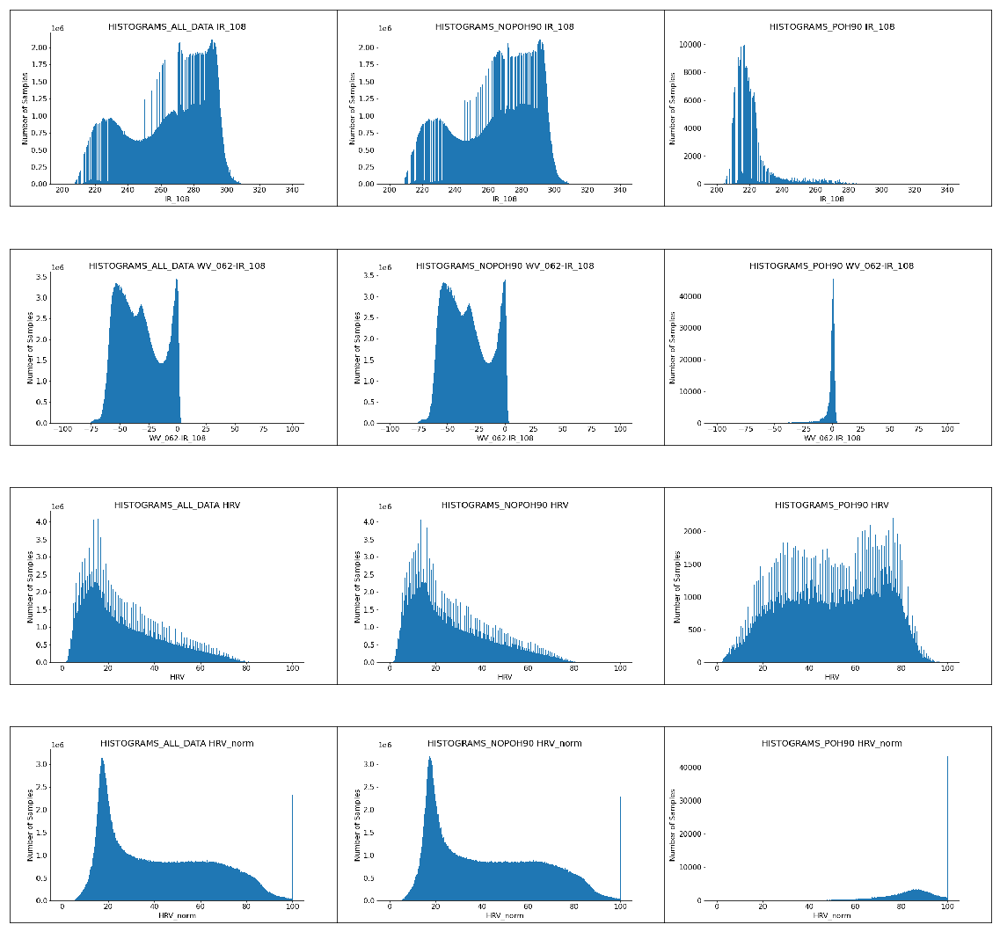

In [44]:
variable_col = ['ALL_DATA', 'NOPOH90', 'POH90']
variable_row = ['IR_108', 'WV_062-IR_108', 'HRV', 'HRV_norm']
ncols = 3
nrows = 4
fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(20, 20))

for icol, var_col in enumerate(variable_col):
    for irow, var_row in enumerate(variable_row):
        img = Image.open('HISTOGRAMS_'+var_col+'_'+var_row+'.png')
        axes[irow, icol].imshow(img)
        axes[irow, icol].set_xticks([])
        axes[irow, icol].set_yticks([])
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

### (b) How does the EDA inform your project plan?

Looking at individual pictures it is clear it seems that there is a good correlation between high POH and the presence of OTs observable from satellite imaginery. Furthermore areas of POH do have a distinct distribution from non-hail areas. 

A critical issue is that part of the information is given by the spatial structure of the high resolution visible channel. This hints at the fact that deep learning techniques may be the best-suited models to tackle the problem instead of more classical techniques that would act at a pixel level.  

One critical issue is that the number of images that can be used for training is not very high for deep learning approaches, especially considering the relatively large size of the images. It is doubtful if the use of a general purpose pre-trained model could help overcome this issue with a dataset that is so different from the typical image classification dataset. A potential solution could be to divide the image in smaller sub-regions which would in theory require less connections and therefore less training samples. It can also be helpful to focus only on regions containing high altitude clouds (e.g. IR_108 below 240 K). 

Another issue that should be explored is whether our threshold for POH at 90% is a good one or lower thresholds can provide better results. Furthermore, it is not yet clear whether the satellite and the radar data are sufficiently collocated to use the radar data as it is. We should explore whether better results are achived by lowering the POH threshold and/or expanding the buffer zone around each high POH pixel

An additional issue is that the HRV images are highly dependent on the angle of illumination of the sun. There are two parameters that have this dependency: the overall luminosity of the image and the actual shape of the OTs. The first issue can be solved by normalizing the data by the cosinus of the sun elevation. The second issue could be partially solved by adding explicitly the position of the sun as an input.  

### (c) What further EDA do you plan for project?

There are several aspects of the project that have to be explored:
- Whether 3 data channels are sufficient
- Whether POH90 is a good proxy or a lower threshold is necessary
- Whether the buffer zone around a POH90 pixel is sufficient

All these aspects can be tackled by experimenting with the model. We will first built the simplest model assuming a perfect match between POH90 and the satellite imaginery and iteratively test the different issues.

## 4) Machine learning 

### (a) Phrase your project goal as a clear machine learning question

In terms of machine learning this is a classification problem. The objective of the project is to identify areas with hail on the ground from satellite imaginery through the identification of typical structures such as overshooting tops. Therefore, there will be two kinds of pixels as output: hail pixels and non-hail pixels.

The features that will be used initially will be the HRV, 10.8 $\mu m$ infrared and the difference between 6.7 and 10.8 $\mu m$ channel. Eventually more satellite channels or differences between channels may be used if the results are not satisfactory.

The target variable is a mask covering the same area as the satellite with "True" for pixels with POH above 90% and "False" for anything else. Lowering the POH threshold may also be explored during the project.

### (b) What models are you planning to use and why?

Since this is a classification problem, at pixel level classical classification techniques such as k-nearest neighbors, logistic regressions, random forests or support vector machines (SVMs) can in principle be explored. A binary decision (hail/no hail) has to be taken in the end. Since there is a considerable overlap of the histograms of pixels containing hail from those not containing any hail non-linear techniques such as random forests or support vector machines seem to be better suited to tackle the problem. One issue to consider is that the number of pixels in the training dataset is rather high (3600 images of 448x256 pixels, i.e. 412'876'800). It is also a highly imbalanced problem with very few pixels containing hail. The imbalance problem can be partially tackled by focusing on areas that are more likely to have OTs, i.e. excluding areas with high IR_108 or very negative channel differences. That would also reduce significantly the number of pixels in the training since less than half the pixels are below this threshold. In any case, random forests are typically better scalable than SVMs. Consequently we will use random forests as a basic model candidate. It is clear from the images above that a lot of information on OTs is contained in the spatial structure rather than in the individual pixels. In order to add spatial information as a feature a 7x7 local standard deviation window will be applied on each variable. 

Despite the use of the local standard deviation in the random forest model, deep-learning techniques are more suitable to capture the spatial structures. Our problem can be described in terms of a classical image segmentation problem where we want to assign to each pixel in the domain whether it has a satellite image feature that contains hail or not. The main difference is that, whereas typical image classification problems use 3 channels (RGB), here potentially more channels are available because infrared and eventually other data can be used. The best suited ML technique for this sort of problems is the convolutional neural network (CNN). Various implementations have been proposed in literature such as the U-NET or the Deeplab v3. Exploring the resources available in the Internet, we have identified an implementation of the [U-NET architecture in Tensorflow 2](https://github.com/jakeret/unet) that might be a very suitable model since it offers flexibility in terms of the size of the images in the number of input channels.

Summarizing we will use two different models to tackle the problem: a conventional machine learning algorithm, the random forests and a deep learning algorithm, U-NET. 

### (c) Please tell us your detailed machine learning strategy 

## Pre-processing of the data

Regardless of the model to be used it would be convenient to normalize the data to values on the range between 0 and 1. We will use min-max scaling for that. The min and max values used for the HRV channel will be 0 and 100%. The min and max algorithm for the infrared and the channel differences will depend on the model used. For random forests, since we focus on areas with possible OTs, the infrared range will be between 202 and 270 and the channel differences range between -50 and 8.4 K. For the U-NET network the entire range of the data will be used, i.e. between -78 and 8.4 K for the channel differences and between 202 and 311 K for the infrared.

## Training and fine tuning of the models

For the random forest model we will tune the number of estimators used. 

The U-NET architecture has several parameters that can be tuned: the depth, the number of filters in the top U-NET layer, the size of the convolutional layers, the size of the max pool layers, the dropout rate, te padding to be used in the convolutions and the activation type to be used. We will first use the defaults suggested by the model. If the results are not satisfactory, we may explore the use of deeper networks and vary the number of filters.

## Metrics

This being a classification problem, we are interested in the probability of detection, i.e. the ratio of hail pixels correctly identified and the false alarm rate, i.e. the ratio of pixels uncorrectly identified as hail. A sophisticated model by [Bedka and Khlopenkov (2016)](https://journals.ametsoc.org/jamc/article/55/9/1983/14245/A-Probabilistic-Multispectral-Pattern-Recognition) reports a probability of detection respect to human identified OTs of 69% and a false detection rate of 18%. We can use these numbers as our baseline.

## 5) Additional information

Since there has been some controversy on the use of the U-NET network we provide a basic example of its use in the jupyter notebook unet_test_tf2.ipynb